# IMPORTS

In [1]:
%matplotlib inline

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.geoaxes
import cosima_cookbook as cc
import copy
import cftime
import datetime
import glob
import numpy as np
import pandas as pd
import xarray as xr
#import xarray.ufuncs as xu
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
import matplotlib.path as mpath
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import os
from netCDF4 import Dataset
from scipy import stats
import xesmf
from xhistogram.xarray import histogram

from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# Functions

In [2]:
def calendar_adjust(da_mon,da_season):
    #OUTPUT: adjusted seasonal data
    tmp = da_season.copy()
    
    tmp.loc[dict(season='DJF')] =  (da_mon.sel(month=11)*8 +
                                 da_mon.sel(month=12)*31 +
                                 da_mon.sel(month=1)*31 +
                                 da_mon.sel(month=2)*28
                                ) / 98
    
    tmp.loc[dict(season='MAM')] =  (da_mon.sel(month=3)*31 +
                                 da_mon.sel(month=4)*30 +
                                 da_mon.sel(month=5)*29
                                ) / 90
    
    tmp.loc[dict(season='JJA')] =  (da_mon.sel(month=5)*2 +
                                 da_mon.sel(month=6)*30 +
                                 da_mon.sel(month=7)*31 +
                                 da_mon.sel(month=8)*21
                                ) / 84
    
    tmp.loc[dict(season='SON')] =  (da_mon.sel(month=8)*10 +
                                 da_mon.sel(month=9)*30 +
                                 da_mon.sel(month=10)*31 +
                                 da_mon.sel(month=11)*22
                                ) / 93
    return tmp

In [3]:
def modTtest3d(x,y,alternative='two-sided',paired=False):
    
    if 'time' in x.dims:
        x = x.groupby('time.year').mean('time')
        y = y.groupby('time.year').mean('time')
    timename = 'year'
    
    nx = x[timename].size
    xAve=x.mean(timename)

    if alternative != "two-sided":
        print('alternative must be two-sided.')
        return

    if paired:
        print("PAIRED MODIFIED t-test for spatial data")
        
        if x.shape != y.shape:
            print('Shapes of x and y not equal!')
            return
        x = x-y
        y = None
        if nx < 30:
            print('Time steps must be >= 30.')
            return

        r1 = calc_lag1Corr(x=x,y=None,xAve=xAve,yAve=None,timename=timename,paired=paired)
        vx = x.var(timename)
        xne_p ,_ , ne = calc_EqvSamplSize_large(x=x,y=None,r1=r1,timename=timename,paired=paired)

        df = xne_p-1
        stderr = (np.sqrt(vx)*ne)
        tstat = xAve/stderr
    else:
        print("UNPAIRED MODIFIED t-test for spatial data")
        
        ny = y[timename].size
        yAve=y.mean(timename)
        
        if nx+ny < 30:
            print('Total time steps must be >= 30.')
            return 
    
        sp2 = calc_poolSampVar(x=x,y=y,xAve=xAve,yAve=yAve,timename=timename)
        r1 = calc_lag1Corr(x=x,y=y,xAve=xAve,yAve=yAve,timename=timename)
        xne_p,yne_p,ne = calc_EqvSamplSize_large(x=x,y=y,r1=r1,timename=timename)
    
        df = xne_p+yne_p-2
        stderr = (np.sqrt(sp2)*ne)
        tstat = (yAve-xAve)/stderr

    #pval = 2 * pt(-abs(tstat), df)
    pval = stats.t.sf(np.abs(tstat), df)*2
    
    return pval

In [4]:
def calc_poolSampVar(x,y,xAve,yAve,timename):

    nx = x[timename].size
    ny = y[timename].size
    
    xsumsq = (x-xAve).dot(x-xAve,dims=timename)
    ysumsq = (y-yAve).dot(y-yAve,dims=timename)

    sp2=(xsumsq+ysumsq)/(nx+ny-2)

    return sp2

In [5]:
def calc_EqvSamplSize_large(x,y,r1,timename,paired=False):

    nx = x[timename].size
    xne = nx*(1-r1)/(1+r1)
    xne_p = xr.where(xne<=2,2,xne)
    xne_p = xr.where(xne_p<=nx,xne_p,(xne_p*0)+nx)
    
    if paired:
        ne = (1/np.sqrt(xne_p))
        yne_p = None
    else:
        ny = y[timename].size
        yne = ny*(1-r1)/(1+r1)
        yne_p = xr.where(yne<=2,2,yne)
        yne_p = xr.where(yne_p<=ny,yne_p,(yne_p*0)+ny)
    
        ne = (1/np.sqrt(xne_p))+(1/np.sqrt(yne_p))

    return xne_p,yne_p,ne

In [6]:
def calc_lag1Corr(x,y,xAve,yAve,timename,paired=False):
        
    x_plus1 = x.copy()
    x_plus1[timename]=x_plus1[timename]-1
    x_plus1 = x_plus1.drop_isel({timename:0})

    if paired:
        r1 = (((x_plus1-xAve).dot(x.drop_isel({timename:-1})-xAve,dims=timename))/
              ((x-xAve).dot(x-xAve,dims=timename))
             )
    else:
        y_plus1 = y.copy()
        y_plus1[timename]=y_plus1[timename]-1
        y_plus1 = y_plus1.drop_isel({timename:0})
        r1 = (((x_plus1-xAve).dot(x.drop_isel({timename:-1})-xAve,dims=timename) +
               (y_plus1-yAve).dot(y.drop_isel({timename:-1})-yAve,dims=timename))/
              ((x-xAve).dot(x-xAve,dims=timename) + (y-yAve).dot(y-yAve,dims=timename))
             )
        
    return r1

In [7]:
def lat_weights(da_lat,latname):
    weights = np.cos(np.deg2rad(da_lat))
    weights.name = 'weights'
    return weights

In [8]:
def print_stats(da,latname,lonname):
    print('Weighted mean = {}'.format(da.weighted(lat_weights(da[latname],latname)).mean([lonname,latname]).values.round(3)))
    print('Unweighted mean = {}'.format(da.mean([lonname,latname]).values.round(3)))
    print('Max = {}'.format(da.max([lonname,latname]).values.round(3)))
    print('Min = {}'.format(da.min([lonname,latname]).values.round(3)))
    return

In [9]:
def walker_test(pval):

    sig_lev = 0.05

    hval = np.where((pval < sig_lev), 1, 0)
    hval = np.where(np.isnan(pval), np.nan, hval)
    K = np.sum(~np.isnan(pval))

    #walker criterium (Wilks, 2006)
    p_walk = 1 - (pow((1-sig_lev),1/K))

    p_min = np.nanmin(pval)
    sig_walk = np.empty(pval.shape)
    sig_walk[:]=np.nan
    if p_min > p_walk:
        sig_walk = 0
    else:
        sig_walk = hval

    sig_pts = np.nansum(sig_walk)

    print("Walker's test")
    print("P_walker = {}".format(p_walk))
    print("Number of significant points: {} out of {} tests.".format(sig_pts,K))

    return(sig_walk)

In [10]:
def FDR(pval):
    sig_lev = 0.05

    hval = np.where((pval < sig_lev), 1, 0)
    hval = np.where(np.isnan(pval), np.nan, hval)
    K = np.sum(~np.isnan(pval))
    
    prob_1D = pval.flatten()
    p_sort = np.sort(prob_1D)
    
    p = np.empty([p_sort.size,])
    p[:]=np.nan

    for k in range(K):
        if (p_sort[k]<= (sig_lev*(k/K))):
            p[k] = p_sort[k]
        else:
            p[k] = 0

    p_fdr = np.nanmax(p)
    fdr = np.where(pval <= p_fdr, 1, 0)
    sig_FDR = np.where(((fdr==1) & (hval==1)), 1, 0)
    sig_pts = np.nansum(sig_FDR)

    print("FDR")
    print("P_FDR = {}".format(p_fdr))
    print("Number of significant points: {} out of {} tests.".format(sig_pts,K))
    
    return(sig_FDR)

In [11]:
def plot_by_modelset(data_dict,model_set1,comp,varname,time_type,unit,lonname,latname,cmap,
                                model_set2=None,ttest=False,field_sigtest=None,sig_only=False,insig_bnd=False,std=False,prct_change=False,levels=None,vmin=None,vmax=None,scale=1):
    if model_set2 == None:
        mode = 'full'
        ttest = False
        prct_change = False
    else:
        mode = 'anom'
    
    if (std==True) and (data_dict!=ts):
        print('Standard deviation can only be applied to the data_dict ts!')
        return
    if mode == 'anom':
        if len(model_set1) != len(model_set2):
            print('The length of model sets must be equal!')
            return
    
    cmap=plt.get_cmap(cmap)
    
    if levels!=None:
        norm = mcolors.BoundaryNorm(levels, ncolors=cmap.N, clip=True)
        vmin = None
        vmax = None
    else:
        norm = None
    
    fig= plt.figure(figsize=(14,np.round(len(model_set1)/2)*5))
    
    if mode == 'full':
        for i, model1 in enumerate(model_set1):

            ax = fig.add_subplot(int(np.round(len(model_set1)/2)),2,i+1, projection=ccrs.cartopy.crs.Robinson(central_longitude=0.0))

            if std:
                data1 = data_dict[model1][comp][varname][time_type].std('time')
            else:
                data1 = data_dict[model1][comp][varname][time_type].mean(time_type)*scale

            plot_data = data1

            plot = ax.pcolormesh(plot_data[lonname], plot_data[latname], plot_data, transform=ccrs.PlateCarree(),
                                 cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)

            ax.add_feature(cfeature.COASTLINE)
            ax.set_title('{}'.format(model1))
        
            cbar = fig.colorbar(plot, ax=ax,orientation="horizontal",pad=0.07,extend='both')
            cbar.set_label(unit)
            gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                              linewidth=2, color='gray', alpha=0.5, linestyle='--')
        
    elif mode == 'anom':

        for i, (model1, model2) in enumerate(zip(model_set1,model_set2)):

            ax = fig.add_subplot(int(np.round(len(model_set1)/2)),2,i+1, projection=ccrs.cartopy.crs.Robinson(central_longitude=0.0))

            if std:
                data1 = (ts[model1][comp][varname]['year']*scale).std('time')
                data2 = (ts[model2][comp][varname]['year']*scale).std('time')
            else:
                data1 = data_dict[model1][comp][varname][time_type].mean(time_type)*scale
                data2 = data_dict[model2][comp][varname][time_type].mean(time_type)*scale

            anom = (data1-data2)

            if prct_change:
                plot_data = (anom/data2)*100
                unit = '%'
            else:
                plot_data = anom
            
            if not sig_only:
                plot = ax.pcolormesh(plot_data[lonname], plot_data[latname], plot_data, transform=ccrs.PlateCarree(),
                                         cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
            
            if ttest:
                ts_data1 = ts[model1][comp][varname]['year']
                ts_data2 = ts[model2][comp][varname]['year']
                statres, pval = stats.ttest_ind(ts_data1,ts_data2,alternative='two-sided')
                
                if field_sigtest == 'walker':
                    spy1 = walker_test(pval)
                elif field_sigtest == 'FDR':
                    spy1 = FDR(pval)
                else:
                    spy1 = np.where(pval < 0.05, 1, np.nan)
                if sig_only:
                    ax.set_facecolor('lightgray')
                    plot = ax.pcolormesh(plot_data[lonname], plot_data[latname],
                                         plot_data.where(spy1==1),
                                         transform=ccrs.PlateCarree(),
                                         cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
                else:
                    plot_ttest = ax.contourf(plot_data[lonname],plot_data[latname],
                                             plot_data.where(spy1!=1)+1, #hatch insignificant area, +1 to get around bug for hatches
                                             transform=ccrs.PlateCarree(),
                                             colors='none',
                                             hatches=['xxx'])
                    if insig_bnd:
                        plot_ttest_bnd = ax.contour(plot_data[lonname],plot_data[latname],
                                                 xr.where(plot_data.where(spy1!=1).isnull(),0,1),
                                                 transform=ccrs.PlateCarree(),
                                                 colors='k',linewidths=1,
                                                 levels=[0])
            
            ax.add_feature(cfeature.COASTLINE)
            ax.set_title('{} - {}'.format(model1,model2))
        
            cbar = fig.colorbar(plot, ax=ax,orientation="horizontal",pad=0.07,extend='both')
            cbar.set_label(unit)
            gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                              linewidth=2, color='gray', alpha=0.5, linestyle='--')
            
    if std:
        std_string = 'standard dev. '
    else:
        std_string = ''
    if mode == 'anom':
        mode_string = 'anomaly'
    else:
        mode_string = ''
    fig.suptitle('{} {}{}'.format(varname.upper(),std_string,mode_string),fontsize=14)
    fig.tight_layout()

In [12]:
def plot_ymonmean_by_season(model1,comp,varname,unit,lonname,latname,cmap,
                            model2=None,ttest=False,ttest_mod=False,field_sigtest=None,ttest_paired=False,
                            sig_only=False,insig_bnd=False,std=False,prct_change=False,levels=None,vmin=None,vmax=None,over_land=False,scale=1,
                           zname=None,zind=None):

    if model2 == None:
        mode = 'full'
        ttest = False
        prct_change = False
    else:
        mode = 'anom'
        
    cmap=plt.get_cmap(cmap)
    
    if levels!=None:
        norm = mcolors.BoundaryNorm(levels, ncolors=cmap.N, clip=True)
        vmin = None
        vmax = None
    else:
        norm = None
    
    fig = plt.figure(figsize=(14,10))

    for i,season in enumerate(['DJF','MAM','JJA','SON']):
        if ttest:
            ts_data1 = ts[model1]['atm'][varname]['raw']
            ts_data2 = ts[model2]['atm'][varname]['raw']
            if zname!=None:
                    ts_data1 = ts_data1.isel({zname:zind})
                    ts_data2 = ts_data2.isel({zname:zind})
            ts_data1 = ts_data1[ts_data1.time.dt.season.isin(season)].groupby('time.year').mean('time')
            ts_data2 = ts_data2[ts_data2.time.dt.season.isin(season)].groupby('time.year').mean('time')
            
        if mode == 'full':
            ax = fig.add_subplot(2,2,i+1, projection=ccrs.cartopy.crs.Robinson(central_longitude=0.0))

            if std:
                data1 = ts[model1][comp][varname]['raw']*scale
                if zname!=None:
                    data1 = data1.isel({zname:zind})
                data1 = data1[data1.time.dt.season.isin(season)].std('time')
            else:
                data1 = accessesm_da[model1][comp][varname]['season'].sel(season=season)*scale
                if zname!=None:
                    data1 = data1.isel({zname:zind})

            plot_data = data1

            if over_land:
                plot_data = plot_data*lsm
            
            plot = ax.pcolormesh(plot_data[lonname], plot_data[latname], plot_data, transform=ccrs.PlateCarree(),
                                     cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
        elif mode == 'anom':
            ax = fig.add_subplot(2,2,i+1, projection=ccrs.cartopy.crs.Robinson(central_longitude=0.0))

            if std:
                data1 = ts[model1][comp][varname]['raw']*scale
                data2 = ts[model2][comp][varname]['raw']*scale
                if zname!=None:
                    data1 = data1.isel({zname:zind})
                    data2 = data2.isel({zname:zind})
                data1 = data1[data1.time.dt.season.isin(season)].std('time')
                data2 = data2[data2.time.dt.season.isin(season)].std('time')
            else:
                data1 = accessesm_da[model1][comp][varname]['season'].sel(season=season)*scale
                data2 = accessesm_da[model2][comp][varname]['season'].sel(season=season)*scale
                if zname!=None:
                    data1 = data1.isel({zname:zind})
                    data2 = data2.isel({zname:zind})

            anom = (data1-data2)

            if prct_change:
                plot_data = (anom/data2)*100
                unit = '%'
            else:
                plot_data = anom

            if over_land:
                plot_data = plot_data*lsm

            #print stats
            print_stats(plot_data,latname,lonname)
            
            if not sig_only:
                plot = ax.pcolormesh(plot_data[lonname], plot_data[latname], plot_data, transform=ccrs.PlateCarree(),
                                     cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)

            if ttest:
                if ttest_mod:
                    pval = modTtest3d(ts_data1,
                                      ts_data2,
                                      alternative='two-sided',
                                      paired=ttest_paired)
                else:
                    if ttest_paired:
                        statres, pval = stats.ttest_rel(ts_data1,ts_data2,alternative='two-sided')
                    else:
                        statres, pval = stats.ttest_ind(ts_data1,ts_data2,alternative='two-sided')
                if field_sigtest == 'walker':
                    spy1 = walker_test(pval)
                elif field_sigtest == 'FDR':
                    spy1 = FDR(pval)
                else:
                    spy1 = np.where(pval < 0.05, 1, np.nan)
                if sig_only:
                    ax.set_facecolor('lightgray')
                    plot = ax.pcolormesh(plot_data[lonname], plot_data[latname],
                                         plot_data.where(spy1==1),
                                         transform=ccrs.PlateCarree(),
                                         cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
                else:
                    plot_ttest = ax.contourf(plot_data[lonname],plot_data[latname],
                                             plot_data.where(spy1!=1)+1, #hatch insignificant area, +1 to get around bug for hatches
                                             transform=ccrs.PlateCarree(),
                                             colors='none',
                                             hatches=['xxx'])
                    if insig_bnd:
                        plot_ttest_bnd = ax.contour(plot_data[lonname],plot_data[latname],
                                                 xr.where(plot_data.where(spy1!=1).isnull(),0,1),
                                                 transform=ccrs.PlateCarree(),
                                                 colors='k',linewidths=1,
                                                 levels=[0])

        ax.add_feature(cfeature.COASTLINE)
        ax.set_title('{}'.format(season))
        cbar = fig.colorbar(plot, ax=ax,orientation="horizontal",pad=0.05,extend='both')
        cbar.set_label(unit)
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                            linewidth=2, color='gray', alpha=0.5, linestyle='--')

    if std:
        std_string = 'standard dev. '
    else:
        std_string = ''
    if zname!=None:
        z_string = ' at {} = {}{}'.format(zname,
                                        accessesm_da[model1][comp][varname]['season'].isel({zname:zind})[zname].values,
                                        accessesm_da[model1][comp][varname]['season'].isel({zname:zind})[zname].units)
    else:
        z_string = ''
        
    if mode == 'anom':
        fig.suptitle('{} - {} {} {}anomaly{}'.format(model1,model2,varname.upper(),std_string,z_string),fontsize=14)
    else:
        fig.suptitle('{} {} {}{}'.format(model1,varname.upper(),std_string,z_string),fontsize=14)
    
    fig.tight_layout()

In [13]:
def plot_annualmean(model1,comp,varname,unit,lonname,latname,cmap,
                    model2=None,ttest=False,field_sigtest=None,sig_only=False,ttest_mod=False,ttest_paired=False,
                    insig_bnd=False,std=False,prct_change=False,levels=None,vmin=None,vmax=None,over_land=False,scale=1,
                    colorbar=True,
                    fig=None,subplot_no=111,
                    plot_proxy=False,
                    mask_uplim=None,mask_dwlim=None,mask_prct=True
                   ):
    if fig == None:
        fig = plt.figure(figsize=(13,10))
        
    if model2 == None:
        mode = 'full'
        ttest = False
        prct_change = False
    else:
        mode = 'anom'
        
    cmap=plt.get_cmap(cmap)
    if ttest:
        ts_data1 = ts[model1][comp][varname]['year']
        ts_data2 = ts[model2][comp][varname]['year']
    
    if levels!=None:
        #norm = mcolors.BoundaryNorm(levels, ncolors=cmap.N, clip=True)
        norm = mcolors.BoundaryNorm(levels, ncolors=cmap.N, extend='both')
        vmin = None
        vmax = None
    else:
        norm = None
    
    ax = fig.add_subplot(subplot_no, projection=ccrs.cartopy.crs.Robinson(central_longitude=0.0))
    if mode == 'full':
        if std:
            data1 = ts[model1][comp][varname]['year']*scale
            data1 = data1.std('time')
        else:
            data1 = accessesm_da[model1][comp][varname]['month'].mean('month')*scale

        plot_data = data1

        if over_land:
            plot_data = plot_data*lsm

        #print stats
        print_stats(plot_data,latname,lonname)
        
        plot = ax.pcolormesh(plot_data[lonname], plot_data[latname], plot_data, transform=ccrs.PlateCarree(),
                                 cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
    elif mode == 'anom':
        if std:
            data1 = ts[model1][comp][varname]['year']*scale
            data1 = data1.std('time')
            data2 = ts[model2][comp][varname]['year']*scale
            data2 = data2.std('time')
        else:
            data1 = accessesm_da[model1][comp][varname]['month'].mean('month')*scale
            data2 = accessesm_da[model2][comp][varname]['month'].mean('month')*scale

        anom = (data1-data2)

        if prct_change:
            plot_data = (anom/data2)*100
            unit = '%'
        else:
            plot_data = anom

        if over_land:
            plot_data = plot_data*lsm

        #print stats
        print_stats(plot_data,latname,lonname)
        
        if not sig_only:
            plot = ax.pcolormesh(plot_data[lonname], plot_data[latname], plot_data, transform=ccrs.PlateCarree(),
                             cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
            if ((mask_uplim is not None)&(mask_dwlim is not None)):
                if mask_prct:
                    mask_data = (anom/data2)*100
                else:
                    mask_data = plot_data
                ax.contourf(plot_data[lonname],plot_data[latname],
                             plot_data.where((mask_data<mask_uplim)&(mask_data>mask_dwlim))+1, #hatch insignificant area, +1 to get around bug for hatches
                             transform=ccrs.PlateCarree(),
                             colors='none',
                             hatches=['\\\\\\\\'])
                
        if ttest:
            if ttest_mod:
                pval = modTtest3d(ts_data1,ts_data2,alternative='two-sided',paired=ttest_paired)
            else:
                if ttest_paired:
                    statres, pval = stats.ttest_rel(ts_data1,ts_data2,alternative='two-sided')
                else:
                    statres, pval = stats.ttest_ind(ts_data1,ts_data2,alternative='two-sided')

            if field_sigtest == 'walker':
                spy1 = walker_test(pval)
            elif field_sigtest == 'FDR':
                spy1 = FDR(pval)
            else:
                spy1 = np.where(pval < 0.05, 1, np.nan)
            if sig_only:
                ax.set_facecolor('lightgray')
                plot = ax.pcolormesh(plot_data[lonname], plot_data[latname],
                                     plot_data.where(spy1==1),
                                     transform=ccrs.PlateCarree(),
                                     cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
                if ((mask_uplim is not None)&(mask_dwlim is not None)):
                    if mask_prct:
                        mask_data = (anom/data2)*100
                    else:
                        mask_data = plot_data
                    ax.contourf(plot_data[lonname],plot_data[latname],
                                 plot_data.where(spy1==1).where((mask_data<mask_uplim)&(mask_data>mask_dwlim))+1, #hatch insignificant area, +1 to get around bug for hatches
                                 transform=ccrs.PlateCarree(),
                                 colors='none',
                                 hatches=['\\\\\\\\'])
            else:
                plot_ttest = ax.contourf(plot_data[lonname],plot_data[latname],
                                         plot_data.where(spy1!=1)+1, #hatch insignificant area, +1 to get around bug for hatches
                                         transform=ccrs.PlateCarree(),
                                         colors='none',
                                         hatches=['////'])
                if insig_bnd:
                    plot_ttest_bnd = ax.contour(plot_data[lonname],plot_data[latname],
                                                 xr.where(plot_data.where(spy1!=1).isnull(),0,1),
                                                 transform=ccrs.PlateCarree(),
                                                 colors='k',linewidths=1,
                                                 levels=[0])

    ax.add_feature(cfeature.COASTLINE)
    
    if plot_proxy and(std==False)and(prct_change==False):
        if (comp=='atm')and(varname=='tas'):
            if model2=='piControl':
                print('Plotting tas proxy')
                '''
                plot_proxy1 = ax.scatter(x=TurneyJones2010_terr['Long.'],
                                             y=TurneyJones2010_terr['Lat.'],
                                             c=TurneyJones2010_terr['Ann. Temp. anom. ˚C (1961-90)'],
                                             transform=ccrs.PlateCarree(),
                                             #s=20,
                                             edgecolors='k',
                                             cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
                '''
                for ref,marker in zip(['Brewer et al. 2008','Capron et al. 2017'],['P','s']):
                    proxy_subset = annual_terr_capron_brewer_arctic[annual_terr_capron_brewer_arctic['Compilation reference']==ref]
                    ax.scatter(x=proxy_subset['Longitude'],
                                 y=proxy_subset['Latitude'],
                                 c=proxy_subset['Anom'],
                                 transform=ccrs.PlateCarree(),
                                 #s=20,
                                 edgecolors='k',marker=marker,
                                 cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)

            elif (model1=='lig127k-GlbVeg') and (model2=='lig127k'):
                print('Plotting tas proxy negative lig127k_bias')
                '''
                plot_proxy1 = ax.scatter(x=TurneyJones2010_terr['Long.'],
                                             y=TurneyJones2010_terr['Lat.'],
                                             c=TurneyJones2010_terr['lig127k_bias']*-1,
                                             transform=ccrs.PlateCarree(),
                                             #s=20,
                                             edgecolors='k',
                                             cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
                '''
                for ref,marker in zip(['Brewer et al. 2008','Capron et al. 2017'],['P','s']):
                    proxy_subset = annual_terr_capron_brewer_arctic[annual_terr_capron_brewer_arctic['Compilation reference']==ref]
                    plot_proxy1 = ax.scatter(x=proxy_subset['Longitude'],
                                                 y=proxy_subset['Latitude'],
                                                 c=proxy_subset['lig127k_bias']*-1,
                                                 transform=ccrs.PlateCarree(),
                                                 #s=20,
                                                 edgecolors='k',marker=marker,
                                                 cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
        
        elif (comp=='ocn')and(varname=='sst'):
            if model2=='piControl':
                print('Plotting sst proxy')
                proxy_subset = hoffman_annsst[~hoffman_annsst.iloc[:,0].isin(list(set(chandler_sst_126ka[chandler_sst_126ka['Season (A annual S summer (months JFM))']=='A']['Event']) &
                                                                                  set(hoffman_annsst.iloc[:,0])))]
                plot_proxy1 = ax.scatter(x=proxy_subset['Lon'],
                                         y=proxy_subset['Lat'],
                                         c=proxy_subset['Temp_anomaly'],
                                         transform=ccrs.PlateCarree(),
                                         #s=20,
                                         edgecolors='k',marker='o',
                                         cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
                plot_proxy2 = ax.scatter(x=capron_127ka_annsst['Lon'],
                                         y=capron_127ka_annsst['Lat'],
                                         c=capron_127ka_annsst['Temp_anomaly'],
                                         transform=ccrs.PlateCarree(),
                                         #s=20,
                                         edgecolors='k',marker='s',
                                         cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
                proxy_subset = chandler_sst_126ka[chandler_sst_126ka['Season (A annual S summer (months JFM))']=='A']
                plot_proxy3 = ax.scatter(x=proxy_subset['Longitude'],
                                         y=proxy_subset['Latitude'],
                                         c=proxy_subset['SST anomaly [°C] (Anomaly relative to the World...)'],
                                         transform=ccrs.PlateCarree(),
                                         #s=20,
                                         edgecolors='k',marker='^',
                                         cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)

            elif (model1=='lig127k-GlbVeg') and (model2=='lig127k'):
                print('Plotting sst proxy negative lig127k_bias')
                proxy_subset = hoffman_annsst[~hoffman_annsst.iloc[:,0].isin(list(set(chandler_sst_126ka[chandler_sst_126ka['Season (A annual S summer (months JFM))']=='A']['Event']) &
                                                                                  set(hoffman_annsst.iloc[:,0])))]
                plot_proxy1 = ax.scatter(x=proxy_subset['Lon'],
                                             y=proxy_subset['Lat'],
                                             c=proxy_subset['lig127k_bias']*-1,
                                             transform=ccrs.PlateCarree(),
                                             #s=20,
                                             edgecolors='k',marker='o',
                                             cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
                plot_proxy2 = ax.scatter(x=capron_127ka_annsst['Lon'],
                                         y=capron_127ka_annsst['Lat'],
                                         c=capron_127ka_annsst['lig127k_bias']*-1,
                                         transform=ccrs.PlateCarree(),
                                         #s=20,
                                         edgecolors='k',marker='s',
                                         cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
                proxy_subset = chandler_sst_126ka[chandler_sst_126ka['Season (A annual S summer (months JFM))']=='A']
                plot_proxy3 = ax.scatter(x=proxy_subset['Longitude'],
                                         y=proxy_subset['Latitude'],
                                         c=proxy_subset['lig127k_bias']*-1,
                                         transform=ccrs.PlateCarree(),
                                         #s=20,
                                         edgecolors='k',marker='^',
                                         cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
                
            
    if colorbar:
        if levels==None:
            cbar = fig.colorbar(plot, ax=ax,orientation='horizontal',pad=0.05,extend='both')
        else:
            cbar = fig.colorbar(plot, ax=ax, ticks=levels, orientation='horizontal',pad=0.05,extend='both')
        cbar.set_label(unit)
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                        linewidth=2, color='gray', alpha=0.5, linestyle='--')
    if std:
        std_string = 'standard dev. '
    else:
        std_string = ''
    if mode == 'anom':
        ax.set_title('{} $-$ {} annual mean {} {}anomaly'.format(model1,model2,varname.upper(),std_string),fontsize=14)
    else:
        ax.set_title('{} annual mean {} {}'.format(model1,varname.upper(),std_string),fontsize=14)
    return fig,plot,ax

In [14]:
def plot_corr_annualmean(model1,model2,comp,varname1,varname2,lonname,latname,cmap,
                            ttest=False,ttest_opt=None,field_sigtest=None,sig_only=False,insig_bnd=False,levels=None,vmin=-1.0,vmax=1.0,over_land=False):

    #if ttest_opt = 2, it will block out the statistically insignicant area of VARNAME2 only.
    #if ttest_opt = 'both', it will block out the statistically insignicant area of both VARNAME1 and 2.
    
    cmap=plt.get_cmap(cmap)

    ts_data1 = ts[model1][comp][varname1]['year']
    ts_data2 = ts[model1][comp][varname2]['year']
    if ttest:
        if ttest_opt == None:
            print('ttest_opt is None.')
            return
        elif ttest_opt == 'both':
            ts_data3 = ts[model2][comp][varname1]['year']
            ts_data4 = ts[model2][comp][varname2]['year']
        elif ttest_opt == 2:
            ts_data4 = ts[model2][comp][varname2]['year']
    ymonmean_data1 = accessesm_da[model2][comp][varname1]['month'].mean('month')
    ymonmean_data2 = accessesm_da[model2][comp][varname2]['month'].mean('month')
        
    if levels!=None:
        norm = mcolors.BoundaryNorm(levels, ncolors=cmap.N, clip=True)
        vmin = None
        vmax = None
    else:
        norm = None
    
    fig, ax = plt.subplots(1,1, figsize=(10,7), subplot_kw=dict(projection=ccrs.cartopy.crs.Robinson(central_longitude=0.0)))

    anom1 = ts_data1 - ymonmean_data1
    anom2 = ts_data2 - ymonmean_data2

    if over_land:
        anom1=anom1*lsm
        anom2=anom2*lsm
    
    corr = xr.corr(anom1,anom2,dim='year')
    
    if not sig_only:
        plot = ax.pcolormesh(corr[lonname], corr[latname], corr, transform=ccrs.PlateCarree(),
                             cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)

    if ttest:
        if ttest_opt == 'both':
            statres, pval = stats.ttest_ind(ts_data1
                                                ,ts_data3
                                                ,alternative='two-sided')
            if field_sigtest == 'walker':
                spy1_1 = walker_test(pval)
            elif field_sigtest == 'FDR':
                spy1_1 = FDR(pval)
            else:
                spy1_1 = np.where(pval < 0.05, 1, np.nan)
            statres, pval = stats.ttest_ind(ts_data2
                                                ,ts_data4
                                                ,alternative='two-sided')
            if field_sigtest == 'walker':
                spy1_2 = walker_test(pval)
            elif field_sigtest == 'FDR':
                spy1_2 = FDR(pval)
            else:
                spy1_2 = np.where(pval < 0.05, 1, np.nan)
            spy1 = np.where((spy1_1==1) & (spy1_2 == 1), 1, np.nan)
        elif  ttest_opt == 2:
            statres, pval = stats.ttest_ind(ts_data2
                                    ,ts_data4
                                    ,alternative='two-sided')
            if field_sigtest == 'walker':
                spy1 = walker_test(pval)
            elif field_sigtest == 'FDR':
                spy1 = FDR(pval)
            else:
                spy1 = np.where(pval < 0.05, 1, np.nan)

        if sig_only:
            ax.set_facecolor('lightgray')
            plot = ax.pcolormesh(corr[lonname], corr[latname],
                                 corr.where(spy1==1),
                                 transform=ccrs.PlateCarree(),
                                 cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
        else:
            plot_ttest = ax.contourf(corr[lonname],corr[latname],
                                     corr.where(spy1!=1)+1, #hatch insignificant area, +1 to get around bug for hatches
                                     transform=ccrs.PlateCarree(),
                                     colors='none',
                                     hatches=['xxx'])
            if insig_bnd:
                plot_ttest_bnd = ax.contour(plot_data[lonname],plot_data[latname],
                                             xr.where(plot_data.where(spy1!=1).isnull(),0,1),
                                             transform=ccrs.PlateCarree(),
                                             colors='k',linewidths=1,
                                             levels=[0])

    ax.add_feature(cfeature.COASTLINE)
    ax.set_title('R-value of $\Delta${} vs $\Delta${}; {} - {} '.format(varname1.upper(),varname2.upper(),model1,model2),fontsize=14)
    cbar = fig.colorbar(plot, ax=ax,orientation="horizontal",pad=0.05,extend='neither')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                        linewidth=2, color='gray', alpha=0.5, linestyle='--')


In [15]:
def plot_corr_by_season(model1,model2,comp,varname1,varname2,lonname,latname,cmap,
                            ttest=False,ttest_opt=None,field_sigtest=None,sig_only=False,insig_bnd=False,levels=None,vmin=-1.0,vmax=1.0,over_land=False):

    #if ttest_opt = 2, it will block out the statistically insignicant area of VARNAME2 only.
    #if ttest_opt = 'both', it will block out the statistically insignicant area of both VARNAME1 and 2.
    
    cmap=plt.get_cmap(cmap)

    ts_data1 = ts[model1][comp][varname1]['raw']
    ts_data2 = ts[model1][comp][varname2]['raw']
    if ttest:
        if ttest_opt == None:
            print('ttest_opt is None.')
            return
        elif ttest_opt == 'both':
            ts_data3 = ts[model2][comp][varname1]['raw']
            ts_data4 = ts[model2][comp][varname2]['raw']
        elif ttest_opt == 2:
            ts_data4 = ts[model2][comp][varname2]['raw']
    ymonmean_data1 = accessesm_da[model2][comp][varname1]['season']
    ymonmean_data2 = accessesm_da[model2][comp][varname2]['season']
        
    if levels!=None:
        norm = mcolors.BoundaryNorm(levels, ncolors=cmap.N, clip=True)
        vmin = None
        vmax = None
    else:
        norm = None
    
    fig = plt.figure(figsize=(14,10))

    for i,season in enumerate(['DJF','MAM','JJA','SON']):
        ax = fig.add_subplot(2,2,i+1, projection=ccrs.cartopy.crs.Robinson(central_longitude=0.0))

        anom1 = ts_data1[ts_data1.time.dt.season.isin(season)] - ymonmean_data1.sel(season=season)
        anom2 = ts_data2[ts_data2.time.dt.season.isin(season)] - ymonmean_data2.sel(season=season)

        if over_land:
            anom1=anom1*lsm
            anom2=anom2*lsm
        
        corr = xr.corr(anom1,anom2,dim='time')
        
        if not sig_only:
            plot = ax.pcolormesh(corr[lonname], corr[latname], corr, transform=ccrs.PlateCarree(),
                                 cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)

        if ttest:
            if ttest_opt == 'both':
                statres, pval = stats.ttest_ind(ts_data1[ts_data1.time.dt.season.isin(season)]
                                                    ,ts_data3[ts_data3.time.dt.season.isin(season)]
                                                    ,alternative='two-sided')
                if field_sigtest == 'walker':
                    spy1_1 = walker_test(pval)
                elif field_sigtest == 'FDR':
                    spy1_1 = FDR(pval)
                else:
                    spy1_1 = np.where(pval < 0.05, 1, np.nan)
                statres, pval = stats.ttest_ind(ts_data2[ts_data2.time.dt.season.isin(season)]
                                                    ,ts_data4[ts_data4.time.dt.season.isin(season)]
                                                    ,alternative='two-sided')
                if field_sigtest == 'walker':
                    spy1_1 = walker_test(pval)
                elif field_sigtest == 'FDR':
                    spy1_2 = FDR(pval)
                else:
                    spy1_2 = np.where(pval < 0.05, 1, np.nan)
                spy1 = np.where((spy1_1==1) & (spy1_2 == 1), 1, np.nan)
            elif  ttest_opt == 2:
                statres, pval = stats.ttest_ind(ts_data2[ts_data2.time.dt.season.isin(season)]
                                        ,ts_data4[ts_data4.time.dt.season.isin(season)]
                                        ,alternative='two-sided')
                if field_sigtest == 'walker':
                    spy1 = walker_test(pval)
                elif field_sigtest == 'FDR':
                    spy1 = FDR(pval)
                else:
                    spy1 = np.where(pval < 0.05, 1, np.nan)

            if sig_only:
                ax.set_facecolor('lightgray')
                plot = ax.pcolormesh(corr[lonname], corr[latname],
                                     corr.where(spy1==1),
                                     transform=ccrs.PlateCarree(),
                                     cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
            else:
                plot_ttest = ax.contourf(corr[lonname],corr[latname],
                                         corr.where(spy1!=1)+1, #hatch insignificant area, +1 to get around bug for hatches
                                         transform=ccrs.PlateCarree(),
                                         colors='none',
                                         hatches=['xxx'])
                if insig_bnd:
                    plot_ttest_bnd = ax.contour(plot_data[lonname],plot_data[latname],
                                                 xr.where(plot_data.where(spy1!=1).isnull(),0,1),
                                                 transform=ccrs.PlateCarree(),
                                                 colors='k',linewidths=1,
                                                 levels=[0])

        ax.add_feature(cfeature.COASTLINE)
        ax.set_title('{}'.format(season))
        cbar = fig.colorbar(plot, ax=ax,orientation="horizontal",pad=0.05,extend='neither')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                            linewidth=2, color='gray', alpha=0.5, linestyle='--')

    fig.suptitle('R-value of $\Delta${} vs $\Delta${}; {} - {} '.format(varname1.upper(),varname2.upper(),model1,model2),fontsize=14)
    
    fig.tight_layout()

In [16]:
def plot_relationship_with_veg(model1,model2,varname,unit,pseudo_level,
                              sig_only=False,field_sigtest=None,ttest_mod=False,std=False,scale=1,surf_frac_null=0.02,
                               latlim=slice(-90,90),lonlim=slice(0,360),
                              ymin=None,ymax=None,cmap='turbo',title=None):
        
    if sig_only:
        ts_data1 = ts[model1]['atm'][varname]['raw']
        ts_data2 = ts[model2]['atm'][varname]['raw']
    
    fig, axs = plt.subplots(2,2, figsize=(14,11))
    for ax,season in zip(axs.ravel(),['DJF','MAM','JJA','SON']):
    
        if std:
            data1 = ts[model1]['atm'][varname]['raw']*scale
            data1 = data1[data1.time.dt.season.isin(season)].std('time')
            data2 = ts[model2]['atm'][varname]['raw']*scale
            data2 = data2[data2.time.dt.season.isin(season)].std('time')
        else:
            data1 = accessesm_da[model1]['atm'][varname]['season'].sel(season=season)*scale
            data2 = accessesm_da[model2]['atm'][varname]['season'].sel(season=season)*scale

        anom = (data1-data2)

        surf_frac_anom = (accessesm_da[model1]['atm']['surf_tile_fraction']['season']
                          -accessesm_da[model2]['atm']['surf_tile_fraction']['season']).sel(season=season).sel(pseudo_level_0=pseudo_level)
        surf_frac_anom = surf_frac_anom.where((surf_frac_anom>surf_frac_null) | (surf_frac_anom<-surf_frac_null))
        
        if sig_only:
            if ttest_mod:
                pval = modTtest3d(ts_data1[ts_data1.time.dt.season.isin(season)].groupby('time.year').mean('time'),
                                  ts_data2[ts_data2.time.dt.season.isin(season)].groupby('time.year').mean('time'),
                                  alternative='two-sided')
            else:
                statres, pval = stats.ttest_ind(ts_data1[ts_data1.time.dt.season.isin(season)]
                                                ,ts_data2[ts_data2.time.dt.season.isin(season)]
                                                ,alternative='two-sided')
            if field_sigtest == 'walker':
                spy1 = walker_test(pval)
            elif field_sigtest == 'FDR':
                spy1 = FDR(pval)
            else:
                spy1 = np.where(pval < 0.05, 1, np.nan)
            anom = anom.where(spy1==1)

        surf_frac_anom = surf_frac_anom.sel(lat=latlim,lon=lonlim)
        anom = anom.sel(lat=latlim,lon=lonlim)
        plot = ax.scatter(surf_frac_anom,
                          anom,
                          s=5,
                           c=np.tile(anom['lat'].values,(anom['lon'].size,1)).transpose(),
                           cmap=cmap,vmin=anom['lat'].min(),vmax=anom['lat'].max())
        ax.set_title('{}'.format(season))
        ax.axvline(x=0,c='k',ls='--')
        ax.axhline(y=0,c='k',ls='--')
        ax.set_ylim(ymin,ymax)
        ax.set_xlim(-1.1,1.1)
        ax.set_xlabel('$\Delta${} fraction'.format(veg_dict[pseudo_level]))
        ax.grid()
        
        if std:
            std_string = 'standard dev. '
        else:
            std_string = ' '
        if unit=='':
            ax.set_ylabel('$\Delta${}{}'.format(varname.upper(),std_string))
        else:
            ax.set_ylabel('$\Delta${}{}({})'.format(varname.upper(),std_string,unit))

    if title!=None:
        fig.suptitle('{} - {}'.format(model1,model2))
    cbar = fig.colorbar(plot, ax=axs.ravel().tolist(), shrink=0.7,orientation="vertical")
    cbar.set_label('latitude')

In [17]:
def plot_relationship_with_veg_halfyr(model1,model2,varname1,unit1,pseudo_level,varname2=None,unit2=None,
                                      sig_only=False,ttest_mod=False,field_sigtest=None,std=False,scale=1,surf_frac_null=0.02,
                                      ymin1=None,ymax1=None,ymin2=None,ymax2=None,cmap='turbo',vmin=None,vmax=None):

    #PFT change on x axis, plot relationships with anomalies of two variables -- one for each y-axis and represented by different symbols.
    #Latitudes represented by colours
    
    fig, axs = plt.subplots(1,2, figsize=(15,5))
    fig.subplots_adjust(wspace=0.3)
    for ax1,months in zip(axs.ravel(),[[12,1,2,3,4,5],[6,7,8,9,10,11]]):
        if varname2 is not None:
            ax2 = ax1.twinx()
        else:
            ax2 = ax1
        
        for (varname,ax,marker,unit,[ymin,ymax]) in zip([varname1,varname2],[ax1,ax2],['.','+'],[unit1,unit2],[[ymin1,ymax1],[ymin2,ymax2]]):
            if varname==None: continue
        
            if sig_only:
                ts_data1 = ts[model1]['atm'][varname]['raw']
                ts_data1 = ts_data1[ts_data1.time.dt.month.isin(months)].groupby('time.year').mean('time')
                ts_data2 = ts[model2]['atm'][varname]['raw']
                ts_data2 = ts_data2[ts_data2.time.dt.month.isin(months)].groupby('time.year').mean('time')
    
            if std:
                data1 = ts[model1]['atm'][varname]['raw']*scale
                data1 = data1[data1.time.dt.month.isin(months)].std('time')
                data2 = ts[model2]['atm'][varname]['raw']*scale
                data2 = data2[data2.time.dt.month.isin(months)].std('time')
            else:
                data1 = accessesm_da[model1]['atm'][varname]['month'].sel(month=months).mean('month')*scale
                data2 = accessesm_da[model2]['atm'][varname]['month'].sel(month=months).mean('month')*scale
    
            anom = (data1-data2)
    
            surf_frac_anom = (accessesm_da[model1]['atm']['surf_tile_fraction']['month']
                              -accessesm_da[model2]['atm']['surf_tile_fraction']['month']).sel(month=months).sel(pseudo_level_0=pseudo_level).mean('month')
            surf_frac_anom = surf_frac_anom.where((surf_frac_anom>surf_frac_null) | (surf_frac_anom<-surf_frac_null))
            
            if sig_only:
                if ttest_mod:
                    pval = modTtest3d(ts_data1,
                                      ts_data2,
                                      alternative='two-sided')
                else:
                    statres, pval = stats.ttest_ind(ts_data1
                                                    ,ts_data2
                                                    ,alternative='two-sided')
                if field_sigtest == 'walker':
                    spy1 = walker_test(pval)
                elif field_sigtest == 'FDR':
                    spy1 = FDR(pval)
                else:
                    spy1 = np.where(pval < 0.05, 1, np.nan)
                anom = anom.where(spy1==1)

            plot = ax.scatter(surf_frac_anom,anom,#s=15,
                              c=np.tile(anom['lat'].values,(192,1)).transpose(),
                              cmap=cmap,marker=marker,label=None,
                              vmin=vmin,vmax=vmax,
                             )
            
            ax.set_ylim(ymin,ymax)
            
            if std:
                std_string = 'standard dev. '
            else:
                std_string = ' '
            if unit=='':
                ax.set_ylabel('$\Delta${}{}'.format(varname.upper(),std_string))
            else:
                ax.set_ylabel('$\Delta${}{}({})'.format(varname.upper(),std_string,unit))
            
        ax1.set_title('Months = {}'.format(months))
        ax1.axvline(x=0,c='k',ls='--')
        ax1.axhline(y=0,c='k',ls='--')
        ax1.set_xlim(-1.1,1.1)
        ax1.set_xlabel('$\Delta${} fraction'.format(veg_dict[pseudo_level]))
        ax1.grid()
        #cbar = fig.colorbar(plot, ax=ax1, shrink=0.7,orientation="vertical",pad=0.2)
        #cbar.set_label('latitude')

        if varname2!=None:
            hidden1 = ax1.scatter(0,0,c='k',marker='.',label=varname1)
            hidden2 = ax1.scatter(0,0,c='k',marker='+',label=varname2)
            ax1.legend()
            hidden1.set_visible(False)
            hidden2.set_visible(False)
    
    #fig.suptitle('{} - {}'.format(model1,model2))
    cbar = fig.colorbar(plot, ax=axs.ravel().tolist(), shrink=0.7,orientation="vertical",pad=0.05)
    cbar.set_label('latitude')

    return fig, axs

In [18]:
def plot_relationship_with_veg_halfyr_v2(model1,model2,varname1,unit1,varname2,unit2,pseudo_level,
                                         sig_only=False,ttest_mod=False,field_sigtest=None,scale=1,surf_frac_null=None,
                                         xmin=None,xmax=None,ymin=None,ymax=None,cmap='turbo',vmin=-90,vmax=90):
    #Anomaly of var1 on x-axis, var2 on y-axis
    #PFT change represented by point size
    #Latitudes represented by colours
    
    fig, axs = plt.subplots(1,2, figsize=(15,5))
    fig.subplots_adjust(wspace=0.3)
    for ax,months in zip(axs.ravel(),[[12,1,2,3,4,5],[6,7,8,9,10,11]]):
        
        if sig_only:
            ts_data11 = ts[model1]['atm'][varname1]['raw']
            ts_data11 = ts_data11[ts_data11.time.dt.month.isin(months)].groupby('time.year').mean('time')
            ts_data21 = ts[model2]['atm'][varname1]['raw']
            ts_data21 = ts_data21[ts_data21.time.dt.month.isin(months)].groupby('time.year').mean('time')
            ts_data12 = ts[model1]['atm'][varname2]['raw']
            ts_data12 = ts_data12[ts_data12.time.dt.month.isin(months)].groupby('time.year').mean('time')
            ts_data22 = ts[model2]['atm'][varname2]['raw']
            ts_data22 = ts_data22[ts_data22.time.dt.month.isin(months)].groupby('time.year').mean('time')
    
        data1 = accessesm_da[model1]['atm'][varname1]['month'].sel(month=months).mean('month')*scale
        data2 = accessesm_da[model2]['atm'][varname1]['month'].sel(month=months).mean('month')*scale
        anom1 = (data1-data2)
        data3 = accessesm_da[model1]['atm'][varname2]['month'].sel(month=months).mean('month')*scale
        data4 = accessesm_da[model2]['atm'][varname2]['month'].sel(month=months).mean('month')*scale
        anom2 = (data3-data4)
    
        surf_frac_anom = (accessesm_da[model1]['atm']['surf_tile_fraction']['month']
                          -accessesm_da[model2]['atm']['surf_tile_fraction']['month']).sel(month=months).sel(pseudo_level_0=pseudo_level).mean('month')
        surf_frac_anom = surf_frac_anom.where((surf_frac_anom>surf_frac_null) | (surf_frac_anom<-surf_frac_null))
            
        if sig_only:
            if ttest_mod:
                pval1 = modTtest3d(ts_data11,
                                   ts_data21,
                                   alternative='two-sided')
                pval2 = modTtest3d(ts_data12,
                                   ts_data22,
                                   alternative='two-sided')
            else:
                statres1, pval1 = stats.ttest_ind(ts_data11
                                                 ,ts_data21
                                                 ,alternative='two-sided')
                statres2, pval2 = stats.ttest_ind(ts_data12
                                                 ,ts_data22
                                                 ,alternative='two-sided')
            if field_sigtest == 'walker':
                spy1 = walker_test(pval1)
                spy2 = walker_test(pval2)
            elif field_sigtest == 'FDR':
                spy1 = FDR(pval1)
                spy2 = FDR(pval2)
            else:
                spy1 = np.where(pval1 < 0.05, 1, np.nan)
                spy2 = np.where(pval2 < 0.05, 1, np.nan)
            
            anom1 = anom1.where((spy1==1) & (spy2==1))
            anom2 = anom2.where((spy1==1) & (spy2==1))
            surf_frac_anom = surf_frac_anom.where((spy1==1) & (spy2==1))

        for cond,marker in zip([surf_frac_anom>0,surf_frac_anom<0],['^','v']):
            plot = ax.scatter(anom1.where(cond),
                              anom2.where(cond),
                              s=np.abs(surf_frac_anom.where(cond))*30,
                           c=np.tile(anom1['lat'].values,(192,1)).transpose(),
                           marker=marker,
                           cmap=cmap,vmin=vmin,vmax=vmax)
            
            
        ax.set_ylim(ymin,ymax)
        ax.set_xlim(xmin,xmax)
        
        if unit1=='':
            ax.set_xlabel('$\Delta${}'.format(varname1.upper()))
        else:
            ax.set_xlabel('$\Delta${} ({})'.format(varname1.upper(),unit1))
        if unit2=='':
            ax.set_ylabel('$\Delta${}'.format(varname2.upper()))
        else:
            ax.set_ylabel('$\Delta${} ({})'.format(varname2.upper(),unit2))
            
        ax.set_title('{}\nMonths = {}'.format(veg_dict[pseudo_level],months))
        ax.axvline(x=0,c='k',ls='--')
        ax.axhline(y=0,c='k',ls='--')
        ax.grid()
        #cbar = fig.colorbar(plot, ax=ax1, shrink=0.7,orientation="vertical",pad=0.2)
        #cbar.set_label('latitude')
    
    #fig.suptitle('{} - {}'.format(model1,model2))
    cbar = fig.colorbar(plot, ax=axs.ravel().tolist(), shrink=0.7,orientation="vertical",pad=0.05)
    cbar.set_label('latitude')

    return fig, axs

In [19]:
def plot_relationship(model1,model2,varname1,unit1,varname2,unit2,
                      sig_only=False,ttest_mod=False,field_sigtest=None,scale=1,
                      xmin=None,xmax=None,ymin=None,ymax=None,over_land=False,cmap='turbo'):
    #sig_only only applies to varname1
    if sig_only:
        ts_data11 = ts[model1]['atm'][varname1]['raw']
        ts_data21 = ts[model2]['atm'][varname1]['raw']
        ts_data12 = ts[model1]['atm'][varname2]['raw']
        ts_data22 = ts[model2]['atm'][varname2]['raw']
    
    
    fig, axs = plt.subplots(2,2, figsize=(14,11))
    for ax,season in zip(axs.ravel(),['DJF','MAM','JJA','SON']):
    
        data1 = accessesm_da[model1]['atm'][varname1]['season'].sel(season=season)*scale
        data2 = accessesm_da[model2]['atm'][varname1]['season'].sel(season=season)*scale
        anom1 = (data1-data2)
        data3 = accessesm_da[model1]['atm'][varname2]['season'].sel(season=season)*scale
        data4 = accessesm_da[model2]['atm'][varname2]['season'].sel(season=season)*scale
        anom2 = (data3-data4)

        if over_land:
            anom1 = anom1*lsm
            anom2 = anom2*lsm
        
        if sig_only:
            if ttest_mod:
                pval1 = modTtest3d(ts_data11[ts_data11.time.dt.season.isin(season)],
                                   ts_data21[ts_data21.time.dt.season.isin(season)],
                                   alternative='two-sided')
                pval2 = modTtest3d(ts_data12[ts_data12.time.dt.season.isin(season)],
                                   ts_data22[ts_data22.time.dt.season.isin(season)],
                                   alternative='two-sided')
            else:
                statres1, pval1 = stats.ttest_ind(ts_data11[ts_data11.time.dt.season.isin(season)]
                                                ,ts_data21[ts_data21.time.dt.season.isin(season)]
                                                ,alternative='two-sided')
                statres2, pval2 = stats.ttest_ind(ts_data12[ts_data12.time.dt.season.isin(season)]
                                                ,ts_data22[ts_data22.time.dt.season.isin(season)]
                                                ,alternative='two-sided')
            if field_sigtest == 'walker':
                spy1 = walker_test(pval1)
                spy2 = walker_test(pval2)
            elif field_sigtest == 'FDR':
                spy1 = FDR(pval1)
                spy2 = FDR(pval2)
            else:
                spy1 = np.where(pval1 < 0.05, 1, np.nan)
                spy2 = np.where(pval2 < 0.05, 1, np.nan)
            
            anom1 = anom1.where((spy1==1) & (spy2==1))
            anom2 = anom2.where((spy1==1) & (spy2==1))

        plot = ax.scatter(anom1,anom2,s=5,
                           c=np.tile(anom1['lat'].values,(192,1)).transpose(),
                           cmap=cmap,vmin=-90,vmax=90)
        ax.set_title('{}'.format(season))
        ax.axvline(x=0,c='k',ls='--')
        ax.axhline(y=0,c='k',ls='--')
        ax.set_ylim(ymin,ymax)
        ax.set_xlim(xmin,xmax)
        if unit1=='':
            ax.set_xlabel('$\Delta${}'.format(varname1.upper()))
        else:
            ax.set_xlabel('$\Delta${} ({})'.format(varname1.upper(),unit1))
        if unit2=='':
            ax.set_ylabel('$\Delta${}'.format(varname2.upper()))
        else:
            ax.set_ylabel('$\Delta${} ({})'.format(varname2.upper(),unit2))
        
        
        ax.grid()

    fig.suptitle('{} - {}'.format(model1,model2))
    cbar = fig.colorbar(plot, ax=axs.ravel().tolist(), shrink=0.7,orientation="vertical")
    cbar.set_label('latitude')

In [20]:
def plot_precip_tas_annualcycle(model1,model2,lat_bnds,lon_bnds,precip_scale=86400,precip_unit='mm/day',over_land=False):

    fig = plt.figure(figsize=(15,4))
    for i,(varname,scale,unit) in enumerate(zip(['tas','precip'],
                                                [1,precip_scale],
                                                ['degC',precip_unit])):
        ax = fig.add_subplot(1,3,i+1)
        for model in [model1,model2]:
            if over_land:
                plot_data = (accessesm_da[model]['atm'][varname]['month']*lsm).sel(lat=slice(lat_bnds[0],lat_bnds[1]),
                                                                                 lon=slice(lon_bnds[0],lon_bnds[1])).mean(['lat','lon'])*scale
            else:
                plot_data = accessesm_da[model]['atm'][varname]['month'].sel(lat=slice(lat_bnds[0],lat_bnds[1]),
                                                                             lon=slice(lon_bnds[0],lon_bnds[1])).mean(['lat','lon'])*scale
            
            ax.plot(accessesm_da[model]['atm'][varname]['month'].month,
                    plot_data,
                    label=model)
        ax.legend()
        ax.set_xticks(accessesm_da[model]['atm'][varname]['month'].month)
        ax.set_ylabel('{} ({})'.format(varname,unit))
        ax.set_xlabel('Month')
        ax.grid()

    ax = fig.add_subplot(1,3,3, projection=ccrs.PlateCarree(central_longitude=0.0))
    ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
    ax.add_patch(mpatches.Rectangle(xy=[lon_bnds[0],lat_bnds[0]],
                                         width=(lon_bnds[1]-lon_bnds[0]),
                                         height=(lat_bnds[1]-lat_bnds[0]),
                                         facecolor='red',
                                         edgecolor='k',
                                         alpha=0.3,
                                         transform=ccrs.PlateCarree()))
    ax.add_feature(cfeature.COASTLINE)
    
    fig.suptitle('Region: Lat={}$^\circ$ to {}$^\circ$; Lon={}$^\circ$ to {}$^\circ$\nOver land = {}'.format(lat_bnds[0],lat_bnds[1],lon_bnds[0],lon_bnds[1],over_land))

In [21]:
def plot_zonal_mean_anom(model1,model2,comp,varname,unit,model3=None,over_land=False,by_season=False,scale=1,
                         title=None,label_mode='full',legend_out=False,xmin=None,xmax=None,
                        fig=None,subplot_no=111):
    if fig == None:
        fig = plt.figure(figsize=(6,7))
        
    if over_land:
        land_mask = lsm
    else:
        land_mask = 1
    
    ax = fig.add_subplot(subplot_no)

    if by_season:
        for season,color in zip(['DJF','MAM','JJA','SON'],
                                ['tab:blue','tab:orange','tab:green','tab:red']):
            data = (accessesm_da[model1][comp][varname]['season']-accessesm_da[model2][comp][varname]['season']).sel(season=season)
            data = (data*land_mask).mean('lon')*scale
            if label_mode=='full':
                label='{}$-${} {}'.format(model1,model2,season)
            elif label_mode=='simple':
                label='{} {}'.format(model1,season)
            elif label_mode=='nomodel':
                label='{}'.format(season)
            ax.plot(data,data['lat'],color=color,label=label)

    if label_mode=='full':
        label='{}$-${} Annual mean'.format(model1,model2)
    elif label_mode=='simple':
            label='{} Annual mean'.format(model1)
    elif label_mode=='nomodel':
        label='Annual mean'
    ax.plot(((accessesm_da[model1][comp][varname]['month']*land_mask).mean(['month','lon'])-(accessesm_da[model2][comp][varname]['month']*land_mask).mean(['month','lon']))*scale,
            (accessesm_da[model1][comp][varname]['month']*land_mask).mean(['month','lon'])['lat'],
            color='k',
            lw=3,label=label)

    if (model3!=None):
        if by_season:
            for season,color in zip(['DJF','MAM','JJA','SON'],
                                    ['tab:blue','tab:orange','tab:green','tab:red']):
                data = (accessesm_da[model3][comp][varname]['season']-accessesm_da[model2][comp][varname]['season']).sel(season=season)
                data = (data*land_mask).mean('lon')*scale
                if label_mode=='full':
                    label='{}$-${} {}'.format(model3,model2,season)
                elif label_mode=='simple':
                    label='{} {}'.format(model3,season)
                elif label_mode=='nomodel':
                    label='{}'.format(season)
                ax.plot(data,data['lat'],color=color,ls='--',label=label)

        if label_mode=='full':
            label='{}$-${} Annual mean '.format(model3,model2)
        elif label_mode=='simple':
            label='{} Annual mean'.format(model3)
        elif label_mode=='nomodel':
            label='Annual mean'
        ax.plot(((accessesm_da[model3][comp][varname]['month']*land_mask).mean(['month','lon'])-(accessesm_da[model2][comp][varname]['month']*land_mask).mean(['month','lon']))*scale,
                (accessesm_da[model3][comp][varname]['month']*land_mask).mean(['month','lon'])['lat'],
                color='k',ls='--',
                lw=3,label=label) 

    
    ax.set_xlabel('{}'.format(unit))
    ax.set_ylabel('latitude')
    ax.grid()
    ax.set_ylim(-90,90)
    if xmin!=None or xmax!=None:
        ax.set_xlim(xmin,xmax)
    ax.axvline(x=0,c='k',ls='--')

    if legend_out:
        box = ax.get_position()
        ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    else:
        ax.legend()

    if title == None:
        if over_land:
            ax.set_title('{} over land'.format(varname.upper()))
        else:
            ax.set_title('{}'.format(varname.upper()))
    else:
        ax.set_title('{}'.format(title))

    #fig.tight_layout()
    return fig,ax

In [23]:
def plot_zonal_mean_anom_custom(model1,model2,comp,varname,unit,model3=None,over_land=False,by_season=False,scale=1,
                                 title=None,label_mode='full',legend_out=False,xmin=None,xmax=None,
                                fig=None,subplot_no=111,data_dict = None):
    if fig == None:
        fig = plt.figure(figsize=(6,7))
        
    if over_land:
        land_mask = lsm
    else:
        land_mask = 1
    
    ax = fig.add_subplot(subplot_no)

    if by_season:
        for season,color in zip(['DJF','MAM','JJA','SON'],
                                ['tab:blue','tab:orange','tab:green','tab:red']):
            data = (data_dict[model1][comp][varname]['season']-accessesm_da[model2][comp][varname]['season']).sel(season=season)
            data = (data*land_mask).mean('lon')*scale
            if label_mode=='full':
                label='{}$-${} {}'.format(model1,model2,season)
            elif label_mode=='simple':
                label='{} {}'.format(model1,season)
            elif label_mode=='nomodel':
                label='{}'.format(season)
            ax.plot(data,data['lat'],color=color,label=label)

    if label_mode=='full':
        label='{}$-${} Annual mean'.format(model1,model2)
    elif label_mode=='simple':
            label='{} Annual mean'.format(model1)
    elif label_mode=='nomodel':
        label='Annual mean'
    ax.plot(((accessesm_da[model1][comp][varname]['month']*land_mask).mean(['month','lon'])-(accessesm_da[model2][comp][varname]['month']*land_mask).mean(['month','lon']))*scale,
            (accessesm_da[model1][comp][varname]['month']*land_mask).mean(['month','lon'])['lat'],
            color='k',
            lw=3,label=label)

    if (model3!=None):
        if by_season:
            for season,color in zip(['DJF','MAM','JJA','SON'],
                                    ['tab:blue','tab:orange','tab:green','tab:red']):
                data = (data_dict[model3][comp][varname]['season']-accessesm_da[model2][comp][varname]['season']).sel(season=season)
                data = (data*land_mask).mean('lon')*scale
                if label_mode=='full':
                    label='{}$-${} {}'.format(model3,model2,season)
                elif label_mode=='simple':
                    label='{} {}'.format(model3,season)
                elif label_mode=='nomodel':
                    label='{}'.format(season)
                ax.plot(data,data['lat'],color=color,ls='--',label=label)

        if label_mode=='full':
            label='{}$-${} Annual mean '.format(model3,model2)
        elif label_mode=='simple':
            label='{} Annual mean'.format(model3)
        elif label_mode=='nomodel':
            label='Annual mean'
        ax.plot(((accessesm_da[model3][comp][varname]['month']*land_mask).mean(['month','lon'])-(accessesm_da[model2][comp][varname]['month']*land_mask).mean(['month','lon']))*scale,
                (accessesm_da[model3][comp][varname]['month']*land_mask).mean(['month','lon'])['lat'],
                color='k',ls='--',
                lw=3,label=label) 

    
    ax.set_xlabel('{}'.format(unit))
    ax.set_ylabel('latitude')
    ax.grid()
    ax.set_ylim(-90,90)
    if xmin!=None or xmax!=None:
        ax.set_xlim(xmin,xmax)
    ax.axvline(x=0,c='k',ls='--')

    if legend_out:
        box = ax.get_position()
        ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    else:
        ax.legend()

    if title == None:
        if over_land:
            ax.set_title('{} over land'.format(varname.upper()))
        else:
            ax.set_title('{}'.format(varname.upper()))
    else:
        ax.set_title('{}'.format(title))

    #fig.tight_layout()
    return fig,ax

In [24]:
def plot_ymonmean_by_season_winds(model1,unit,cmap,
                                  model2=None,ttest=False,field_sigtest=None,sig_only=False,insig_bnd=False,prct_change=False,levels=None,vmin=None,vmax=None,scale=1,
                                  quiver_scale=500,skip = slice(None,None,3),quiverkey_mag=10):
    comp = 'atm'
    varname='10m_wind_speed'
    lonname='lon_u'
    latname='lat_v'
    
    if model2 == None:
        mode = 'full'
        ttest = False
        prct_change = False
    else:
        mode = 'anom'
        
    cmap=plt.get_cmap(cmap)
    if ttest:
        ts_data1 = ts[model1][comp][varname]['raw']
        ts_data2 = ts[model2][comp][varname]['raw']
    
    if levels!=None:
        norm = mcolors.BoundaryNorm(levels, ncolors=cmap.N, clip=True)
        vmin = None
        vmax = None
    else:
        norm = None
    
    fig = plt.figure(figsize=(14,10))

    for i,season in enumerate(['DJF','MAM','JJA','SON']):
        if mode == 'full':
            ax = fig.add_subplot(2,2,i+1, projection=ccrs.cartopy.crs.Robinson(central_longitude=0.0))

            plot_data = accessesm_da[model1][comp][varname]['season'].sel(season=season)*scale

            uwind = accessesm_da[model1][comp]['10U']['season'].sel(season=season)
            vwind = accessesm_da[model1][comp]['10V']['season'].sel(season=season)
            uwind = uwind.interp({latname:uwind[latname][skip],lonname:uwind[lonname][skip]})
            vwind = vwind.interp({latname:vwind[latname][skip],lonname:vwind[lonname][skip]})
            
            plot = ax.pcolormesh(plot_data[lonname], plot_data[latname], plot_data, transform=ccrs.PlateCarree(),
                                     cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
            quiver = ax.quiver(uwind[lonname].values, uwind[latname].values,
                               uwind.values,
                               vwind.values,
                               color='k',
                               transform=ccrs.PlateCarree(),
                               scale_units='width',
                               scale=quiver_scale)
        
        elif mode == 'anom':
            ax = fig.add_subplot(2,2,i+1, projection=ccrs.cartopy.crs.Robinson(central_longitude=0.0))

            data1 = accessesm_da[model1][comp][varname]['season'].sel(season=season)*scale
            data2 = accessesm_da[model2][comp][varname]['season'].sel(season=season)*scale

            anom = (data1-data2)

            if prct_change:
                plot_data = (anom/data2)*100
                unit = '%'
            else:
                plot_data = anom

            uwind = accessesm_da[model1][comp]['10U']['season'].sel(season=season)-accessesm_da[model2][comp]['10U']['season'].sel(season=season)
            vwind = accessesm_da[model1][comp]['10V']['season'].sel(season=season)-accessesm_da[model2][comp]['10V']['season'].sel(season=season)
            
            if not sig_only:
                plot = ax.pcolormesh(plot_data[lonname], plot_data[latname], plot_data, transform=ccrs.PlateCarree(),
                                     cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
                
                uwind = uwind.interp({latname:uwind[latname][skip],lonname:uwind[lonname][skip]})
                vwind = vwind.interp({latname:vwind[latname][skip],lonname:vwind[lonname][skip]})

            if ttest:
                statres, pval = stats.ttest_ind(ts_data1[ts_data1.time.dt.season.isin(season)]
                                                    ,ts_data2[ts_data2.time.dt.season.isin(season)]
                                                    ,alternative='two-sided')
                if field_sigtest == 'walker':
                    spy1 = walker_test(pval)
                elif field_sigtest == 'FDR':
                    spy1 = FDR(pval)
                else:
                    spy1 = np.where(pval < 0.05, 1, np.nan)
                if sig_only:
                    ax.set_facecolor('lightgray')
                    plot = ax.pcolormesh(plot_data[lonname], plot_data[latname],
                                         plot_data.where(spy1==1),
                                         transform=ccrs.PlateCarree(),
                                         cmap=cmap,vmin=vmin,vmax=vmax,norm=norm)
                else:
                    plot_ttest = ax.contourf(plot_data[lonname],plot_data[latname],
                                             plot_data.where(spy1!=1)+1, #hatch insignificant area, +1 to get around bug for hatches
                                             transform=ccrs.PlateCarree(),
                                             colors='none',
                                             hatches=['xxx'])
                    if insig_bnd:
                        plot_ttest_bnd = ax.contour(plot_data[lonname],plot_data[latname],
                                                 xr.where(plot_data.where(spy1!=1).isnull(),0,1),
                                                 transform=ccrs.PlateCarree(),
                                                 colors='k',linewidths=1,
                                                 levels=[0])
                
                uwind = uwind.where(spy1==1).interp({latname:uwind[latname][skip],lonname:uwind[lonname][skip]})
                vwind = vwind.where(spy1==1).interp({latname:vwind[latname][skip],lonname:vwind[lonname][skip]})
            quiver = ax.quiver(uwind[lonname].values,
                               uwind[latname].values,
                               uwind.values,vwind.values,
                               color='k',
                               transform=ccrs.PlateCarree(),
                               scale_units='width',
                               scale=quiver_scale)

        ax.add_feature(cfeature.COASTLINE)
        ax.set_title('{}'.format(season))
        cbar = fig.colorbar(plot, ax=ax,orientation="horizontal",pad=0.05,extend='both')
        cbar.set_label(unit)
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                            linewidth=2, color='gray', alpha=0.5, linestyle='--')
        qk = ax.quiverkey(quiver, 0.95, 0.05, quiverkey_mag, r'${} m/s$'.format(quiverkey_mag), labelpos='E',
                           coordinates='axes')

    if mode == 'anom':
        fig.suptitle('{} - {} {} anomaly'.format(model1,model2,varname.upper()),fontsize=14)
    else:
        fig.suptitle('{} {}'.format(model1,varname.upper()),fontsize=14)
    
    fig.tight_layout()

In [25]:
def npole(ax):
    """
    Creates a stereographic, round plot of Antarctica
   
    Parameters:
    -----------
        ax: axis on which to plot Antarctica
        max_lat: negative integer with the maximum latitude to show (i.e. -°S)
   
    Returns:
    --------
        ax: axis with Antarctica plotted
    """
   
    # Limit the map to max_lat degrees latitude and below
    #ax.set_extent([-180, 180, 60, 90], ccrs.PlateCarree())
    ax.set_extent([-180, 180, 50, 90], ccrs.PlateCarree())

    gl = ax.gridlines(color='DarkSlateGray', linestyle='--')
    # Show gridlines: meridians every 45°, parallels every 10°
    gl.xlocator = mticker.FixedLocator(np.arange(-180, 181, 45))
    #gl.ylocator = mticker.FixedLocator(np.arange(60, 91, 15))
    gl.ylocator = mticker.FixedLocator(np.arange(30, 91, 10))

    ax.add_feature(cfeature.LAND, color='Khaki')
    ax.add_feature(cfeature.COASTLINE)
    #ax.add_feature(cfeature.OCEAN)

    # Compute a circle in axes coordinates to use as the map's boundary
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    #ax.set_boundary(circle, transform=ax.transAxes)
   
    return ax

In [26]:
def spole(ax):
    """
    Creates a stereographic, round plot of Antarctica
   
    Parameters:
    -----------
        ax: axis on which to plot Antarctica
        max_lat: negative integer with the maximum latitude to show (i.e. -°S)
        show_details: boolean indicating whether to plot the land, ocean & grids
   
    Returns:
    --------
        ax: axis with Antarctica plotted
    """
   
    # Limit the map to max_lat degrees latitude and below
    ax.set_extent([-180, 180, -90, -50], ccrs.PlateCarree())

    gl = ax.gridlines(color='DarkSlateGray', linestyle='--')
    # Show gridlines: meridians every 45°, parallels every 10°
    gl.xlocator = mticker.FixedLocator(np.arange(-180, 181, 45))
    gl.ylocator =  mticker.FixedLocator(np.arange(-90, -29, 10))
       
    ax.add_feature(cfeature.LAND, color='Khaki')
    ax.add_feature(cfeature.COASTLINE)

    # Compute a circle in axes coordinates to use as the map's boundary
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    #ax.set_boundary(circle, transform=ax.transAxes)
   
    return ax

In [27]:
#Precip CMAP definition
precip_clevs = [0, 1, 2.5, 5, 7.5, 10, 15, 20, 30, 40,
         50, 70, 100, 150, 200, 250, 300, 400, 500, 600, 750]
precip_cmap_data = [(1.0, 1.0, 1.0),
             (0.3137255012989044, 0.8156862854957581, 0.8156862854957581),
             (0.0, 1.0, 1.0),
             (0.0, 0.8784313797950745, 0.501960813999176),
             (0.0, 0.7529411911964417, 0.0),
             (0.501960813999176, 0.8784313797950745, 0.0),
             (1.0, 1.0, 0.0),
             (1.0, 0.6274510025978088, 0.0),
             (1.0, 0.0, 0.0),
             (1.0, 0.125490203499794, 0.501960813999176),
             (0.9411764740943909, 0.250980406999588, 1.0),
             (0.501960813999176, 0.125490203499794, 1.0),
             (0.250980406999588, 0.250980406999588, 1.0),
             (0.125490203499794, 0.125490203499794, 0.501960813999176),
             (0.125490203499794, 0.125490203499794, 0.125490203499794),
             (0.501960813999176, 0.501960813999176, 0.501960813999176),
             (0.8784313797950745, 0.8784313797950745, 0.8784313797950745),
             (0.9333333373069763, 0.8313725590705872, 0.7372549176216125),
             (0.8549019694328308, 0.6509804129600525, 0.47058823704719543),
             (0.6274510025978088, 0.42352941632270813, 0.23529411852359772),
             (0.4000000059604645, 0.20000000298023224, 0.0)]
precip_cmap = mcolors.ListedColormap(precip_cmap_data, 'precipitation')
precip_norm = mcolors.BoundaryNorm(precip_clevs, precip_cmap.N)

In [28]:
def align_yaxis(ax1, v1, ax2, v2):
    """adjust ax2 ylimit so that v2 in ax2 is aligned to v1 in ax1"""
    _, y1 = ax1.transData.transform((0, v1))
    _, y2 = ax2.transData.transform((0, v2))
    inv = ax2.transData.inverted()
    _, dy = inv.transform((0, 0)) - inv.transform((0, y1-y2))
    miny, maxy = ax2.get_ylim()
    ax2.set_ylim(miny+dy, maxy+dy)

In [29]:
def convert_lon(da,lonname):
    # Convert longitude to 0 to 360
    lon = da.coords[lonname]
    
    converted = da.assign_coords({lon.name: ((lon + 360)%360)})
    
    return converted

In [30]:
def select_monsoon(da,lon_name,lat_name,lon_range,lat_range,lonlat_bound):
    # da has to be from 0 to 360
    # lon_range has to be from -180 to 180
    
    lon_min,lon_max,lat_min,lat_max = lonlat_bound
    
    if lon_max > lon_min:
        selected = da.loc[{lon_name: (lon_range[(lon_range > lon_min) & (lon_range < lon_max)]%360),
                           lat_name: (lat_range[(lat_range > lat_min) & (lat_range < lat_max)])}]
    elif lon_max < lon_min:
        selected = da.loc[{lon_name: (lon_range[(lon_range > lon_min) | (lon_range < lon_max)]%360),
                           lat_name: (lat_range[(lat_range > lat_min) & (lat_range < lat_max)])}]

    return selected

In [31]:
def ar(pr_data_ymon,hemi):
    
    if hemi == 'north':
        summer_mon = [5,6,7,8,9]
        winter_mon = [11,12,1,2,3]
    elif hemi == 'south':
        summer_mon = [11,12,1,2,3]
        winter_mon = [5,6,7,8,9]
    
    ar = (pr_data_ymon.sel(month=summer_mon).mean('month')-\
                    pr_data_ymon.sel(month=winter_mon).mean('month'))*60*60*24
    return ar

In [32]:
def prct_change(new,old):
    
    prct_change = ((new-old)/old)*100
    
    return prct_change

In [33]:
def monsoon_prct_change(lig_monsoon,pi_monsoon,hemi,land_or_ocean):
    
    ar_threshold = 2.5 #mm/day
                        
    if land_or_ocean == 'land':
        mask = lsm
    elif land_or_ocean == 'ocean':
        mask = om
    elif land_or_ocean == 'all':
        mask = xr.where(lsm,1,1)
    
    if hemi == 'north':
        summer_mon = [5,6,7,8,9]
        winter_mon = [11,12,1,2,3]
    elif hemi == 'south':
        summer_mon = [11,12,1,2,3]
        winter_mon = [5,6,7,8,9]
    
    lig_ar = ar(lig_monsoon,hemi)*mask
    pi_ar = ar(pi_monsoon,hemi)*mask
    
    # New monsoon criteria: Monsoon precip intensity (MPI) > 0.55
    # MPI = ar/annual mean
    lig_am = lig_monsoon.mean('month')*60*60*24
    pi_am = pi_monsoon.mean('month')*60*60*24
    lig_mpi = lig_ar/lig_am
    pi_mpi = pi_ar/pi_am
    #

    # Mean precipitation within monsoon domain during monsoon season
    #lig_pav = lig_monsoon.where(lig_ar > ar_threshold).sel(month=summer_mon).mean(['latitude','longitude','month'])
    #pi_pav = pi_monsoon.where(pi_ar > ar_threshold).sel(month=summer_mon).mean(['latitude','longitude','month'])
    lig_pav = lig_monsoon.where((lig_ar > ar_threshold) & (lig_mpi > 0.55)).sel(month=summer_mon).mean(['lat','lon','month'])
    pi_pav = pi_monsoon.where((pi_ar > ar_threshold) & (pi_mpi > 0.55)).sel(month=summer_mon).mean(['lat','lon','month'])
    
    # Need area weighting since calculating areal extent
    #lig_aav = (xr.where(lig_ar>ar_threshold,1,0)*(xu.cos(lsm.latitude*(np.pi/180)))).sum()
    #pi_aav = (xr.where(pi_ar>ar_threshold,1,0)*(xu.cos(lsm.latitude*(np.pi/180)))).sum()
    #lig_aav = (xr.where((lig_ar>ar_threshold) & (lig_mpi > 0.55),1,0)*(xu.cos(lsm.latitude*(np.pi/180)))).sum()
    #pi_aav = (xr.where((pi_ar>ar_threshold) & (pi_mpi > 0.55),1,0)*(xu.cos(lsm.latitude*(np.pi/180)))).sum()
    lig_aav = (xr.where((lig_ar>ar_threshold) & (lig_mpi > 0.55),1,0)*(np.cos(lsm.lat*(np.pi/180)))).sum()
    pi_aav = (xr.where((pi_ar>ar_threshold) & (pi_mpi > 0.55),1,0)*(np.cos(lsm.lat*(np.pi/180)))).sum()
    # Total water precipitatied, computed as precip rate times areal extent
    lig_totwater = lig_pav*lig_aav
    pi_totwater = pi_pav*pi_aav
    
    pav_prct_diff = prct_change(lig_pav,pi_pav)
    aav_prct_diff = prct_change(lig_aav,pi_aav)
    totwater_prct_diff = prct_change(lig_totwater,pi_totwater)
    
    return pav_prct_diff,aav_prct_diff,totwater_prct_diff

In [34]:
def wgt_zonalmean_1(data,wgtmat):
    
    # Calculate weighted zonal mean. Require longitude_1 and latitude_1
    #data_zonal = ((data*wgtmat).sum('longitude_1'))/(wgtmat.sum('latitude_1')[0])
    data_zonal = ((data*wgtmat).sum('lon_u'))/(wgtmat.sum('lat_v')[0])
    
    return data_zonal

In [35]:
def wgt_pcumsum(data,wgtmat):
    
    # Calculate weighted cumulative sum across pressure. Require p_1
    #data_pcumsum = ((data*wgtmat).cumsum('p_1'))/(wgtmat.sum('p_1'))
    data_pcumsum = ((data*wgtmat).cumsum('pressure'))/(wgtmat.sum('pressure'))
    
    return data_pcumsum

# LOAD

In [36]:
# Atmos land fraction
atm_land = xr.open_dataset('/g/data/y99/nky548/access-esm/plots/mapplots_220308/land.nc')

da_ymonmean_init = {
                   #'lig_veg4-lig_veg4.1': {
                   #             'atm':xr.open_dataset('/g/data/y99/nky548/input/lig_veg4-lig_veg4.1/ymonmean/lig_veg4-lig_veg4.1.pa-1172-1422_ymonmean.nc'),
                   #             'ice':xr.open_dataset('/g/data/y99/nky548/input/lig_veg4-lig_veg4.1/ymonmean/iceh.1172-1422_ymonmean.nc'),
                   #             'ocn':xr.open_dataset('/g/data/y99/nky548/input/lig_veg4-lig_veg4.1/ymonmean/ocean_month_1172-1422_ymonmean.nc')},
                   'lig127k': {
                               'atm':xr.open_dataset('/g/data/y99/nky548/input/lig_gadi/ymonmean/lig_gadi.pa-1474-1673_ymonmean.nc'),
                               'ice':xr.open_dataset('/g/data/y99/nky548/input/lig_gadi/ymonmean/iceh.1474-1673_ymonmean.nc'),
                               'ocn':xr.open_dataset('/g/data/y99/nky548/input/lig_gadi/ymonmean/ocean_month_1474-1673_ymonmean.nc')},
                   'lig127k-GlbVeg': {
                               'atm':xr.open_dataset('/g/data/y99/nky548/input/lig_veg4.2/ymonmean/lig_veg4.2.pa-1474-1673_ymonmean.nc'),
                               'ice':xr.open_dataset('/g/data/y99/nky548/input/lig_veg4.2/ymonmean/iceh.1474-1673_ymonmean.nc'),
                               'ocn':xr.open_dataset('/g/data/y99/nky548/input/lig_veg4.2/ymonmean/ocean_month_1474-1673_ymonmean.nc')},
                   'piControl':{
                       'atm':xr.open_dataset('/g/data/y99/nky548/input/PI-01/ymonmean/PI-01.pa-1014-1113_ymonmean.nc'),
                       'ocn':xr.open_dataset('/g/data/y99/nky548/access-esm/extracted/ocean_4D/PI-01/ocean/out_1014-1113_ymonmean.nc')
                   }
                   }

# Atmos weighting for latitude_1, longitude_1 and p_1
atm_wgt = xr.open_dataset('/g/data/y99/nky548/access-esm/plots/mapplots_220308/wgt.nc')

#ice cell area (from atmos)
#ice_cellarea = xr.open_dataset('/g/data/y99/nky548/access-esm/extracted/ice_from_atmos/lig_veg3/atmosphere/cellarea.nc')
#ice_cellarea = ice_cellarea.rename({'latitude': 'lat','longitude':'lon'})
ice_cellarea = xr.open_dataset('/g/data/y99/nky548/access-esm/sea-ice_RawOutputSample/iceh.1401-01.nc')
ice_cellarea = ice_cellarea.tarea

#atmos cell area
atm_cellarea = xr.open_dataset('/g/data/fs38/publications/CMIP6/PMIP/CSIRO/ACCESS-ESM1-5/lig127k/r1i1p1f1/fx/areacella/gn/files/d20191206/areacella_fx_ACCESS-ESM1-5_lig127k_r1i1p1f1_gn.nc').areacella

In [37]:
#PROXY
#Chandler, David M; Langebroek, Petra M (2021): 
#https://doi.pangaea.de/10.1594/PANGAEA.938620
chandler_sst = pd.read_csv('/g/data/y99/nky548/access-esm/plots/plot_raw/Chandler-Langebroek_2021_SST-anom_dataonly.csv',sep='\t')
chandler_sst = chandler_sst[(chandler_sst['Age [ka BP] (Chronology follows Lisiecki a...)']>=122) &
                            (chandler_sst['Age [ka BP] (Chronology follows Lisiecki a...)']<=132)].reset_index()
chandler_sst.drop(columns=['index'],inplace=True)
chandler_sst_126ka = chandler_sst.loc[chandler_sst['Age [ka BP] (Chronology follows Lisiecki a...)']==126]
chandler_sst_126ka = chandler_sst_126ka.dropna(subset=['SST anomaly [°C] (Anomaly relative to the World...)'])
chandler_sst_126ka = chandler_sst_126ka.reset_index(drop=True)
chandler_sst_126ka.loc[chandler_sst_126ka['Longitude']<-280, 'Longitude'] = chandler_sst_126ka.loc[chandler_sst_126ka['Longitude']<-280, 'Longitude']+360
chandler_sst_126ka.loc[chandler_sst_126ka['Longitude']>80, 'Longitude'] = chandler_sst_126ka.loc[chandler_sst_126ka['Longitude']>80, 'Longitude']-360

In [38]:
capron_127ka_annsst = pd.read_excel('/g/data/y99/nky548/access-esm/plots/plot_raw/127k_capron2017_forPMIP4.xlsx',sheet_name='Annual SST',
                    usecols='A,B,C,D,E,F,G,H,O,P')
capron_127ka_annsst = capron_127ka_annsst.rename(columns={'Latitude':'Lat', 'Longitude':'Lon',
                                      'Elevation [m]':'Elevation_(m)','Temperature reconstruction Proxy':'Method',
                                      '127 ka Median PIAn [°C]':'Temp_anomaly',
                                      '127 ka 2s PIAn [°C]':'2sigma_error'})
capron_127ka_annsst.loc[capron_127ka_annsst['Lon']<-280, 'Lon'] = capron_127ka_annsst.loc[capron_127ka_annsst['Lon']<-280, 'Lon']+360
capron_127ka_annsst.loc[capron_127ka_annsst['Lon']>80, 'Lon'] = capron_127ka_annsst.loc[capron_127ka_annsst['Lon']>80, 'Lon']-360

hoffman_annsst = pd.read_excel('/g/data/y99/nky548/access-esm/plots/plot_raw/Hoffman_etal_updated_127ka_PMIP4.xlsx',sheet_name='Annual',header=1,
                    usecols='A,B,C,D,E,J,K,L')
hoffman_annsst = hoffman_annsst.rename(columns={'Latitude':'Lat', 'Longitude':'Lon',
                                      'SST reconstruction method':'Method',
                                      'Inferred proxy signal':'Signal',
                                      '[127ka -2SD] Temp. Ano. (°C)':'Temp_anomaly-2sd',
                                      '[127ka Mean] Temp. Ano. (°C)':'Temp_anomaly',
                                      '[127ka +2SD] Temp. Ano. (°C)':'Temp_anomaly+2sd'})
hoffman_annsst.loc[hoffman_annsst['Lon']<-280, 'Lon'] = hoffman_annsst.loc[hoffman_annsst['Lon']<-280, 'Lon']+360
hoffman_annsst.loc[hoffman_annsst['Lon']>80, 'Lon'] = hoffman_annsst.loc[hoffman_annsst['Lon']>80, 'Lon']-360

TurneyJones2010 = pd.read_excel('/g/data/y99/nky548/access-esm/plots/mapplots_220308/jqs_1423_sm_suppinfo.xlsx',header=4)
TurneyJones2010_terr = TurneyJones2010[168:268].reset_index(drop=True)
TurneyJones2010_terr.loc[TurneyJones2010_terr['Long.']<0, 'Long.'] = TurneyJones2010_terr.loc[TurneyJones2010_terr['Long.']<0, 'Long.']+360

In [39]:
#otto-bliesner 2020
annual_NH_capron_hoffman = pd.read_excel('/g/data/y99/nky548/access-esm/plots/mapplots_220308/proxy/Table S2. Annual - NH Oceans, Europe, and Greenland (40-90N)_CP-2019-174.xlsx',
                                         sheet_name='capron_hoffman',
                                        header=2)
#Europe land only
annual_NH_brewer = pd.read_excel('/g/data/y99/nky548/access-esm/plots/mapplots_220308/proxy/Table S2. Annual - NH Oceans, Europe, and Greenland (40-90N)_CP-2019-174.xlsx',
                                 sheet_name='brewer',
                                 header=0)
#ocean only
annual_LL = pd.read_excel('/g/data/y99/nky548/access-esm/plots/mapplots_220308/proxy/Table S3. Annual - Low latitudes (40S-40N)_CP-2019-174.xlsx',
                         header=2)
#SH ocean and antarctica
annual_SH = pd.read_excel('/g/data/y99/nky548/access-esm/plots/mapplots_220308/proxy/Table S4. Annual - SH Oceans and Antarctica (40-90S)_CP-2019-174.xlsx',
                          header=2)

JJA_NH_ocean = pd.read_excel('/g/data/y99/nky548/access-esm/plots/mapplots_220308/proxy/Table S5. JJA - NH Oceans (40-90N) JJA_CP-2019-174.xlsx',
                             header=2)
JJA_NH_land = pd.read_excel('/g/data/y99/nky548/access-esm/plots/mapplots_220308/proxy/Table S6. JJA - NH terrestrial (40-90N) JJA__CP-2019-174.xlsx',
                           header=2)
#Combine to land
annual_terr_capron_brewer_arctic = pd.concat([annual_NH_brewer, annual_NH_capron_hoffman[0:1],annual_SH[0:4].drop(columns=['Unnamed: 1'])]).reset_index(drop=True)
annual_terr_capron_brewer_arctic.loc[annual_terr_capron_brewer_arctic['Longitude']<0, 'Longitude'] = annual_terr_capron_brewer_arctic.loc[annual_terr_capron_brewer_arctic['Longitude']<0, 'Longitude']+360

In [40]:
ts_init = {
#           'lig_veg4-lig_veg4.1':{'ocn':xr.open_dataset("/g/data/y99/nky548/input/lig_veg4-lig_veg4.1/var_subset/sst_1172-1422.nc"),
#                                  'atm':xr.open_mfdataset(["/g/data/y99/nky548/input/lig_veg4-lig_veg4.1/var_subset/tas_1172-1422.nc",
#                                                           "/g/data/y99/nky548/input/lig_veg4-lig_veg4.1/var_subset/precip_1172-1422.nc",
#                                                           "/g/data/y99/nky548/input/lig_veg4-lig_veg4.1/var_subset/mslp_1172-1422.nc",
#                                                           "/g/data/y99/nky548/input/lig_veg4-lig_veg4.1/var_subset/surf_SW_CS_1172-1422.nc",
#                                                           "/g/data/y99/nky548/input/lig_veg4-lig_veg4.1/var_subset/heat_flux_1172-1422.nc",
#                                                           "/g/data/y99/nky548/input/lig_veg4-lig_veg4.1/var_subset/10m_wind_1172-1422.nc"],
#                                                           compat='override')
#                       },
           'lig127k':{'ocn':xr.open_dataset("/g/data/y99/nky548/input/lig_gadi/var_subset/sst_1474-1673.nc"),
                       'atm':xr.open_mfdataset(["/g/data/y99/nky548/input/lig_gadi/var_subset/tas_1474-1673.nc",
                                                "/g/data/y99/nky548/input/lig_gadi/var_subset/precip_1474-1673.nc",
                                                "/g/data/y99/nky548/input/lig_gadi/var_subset/mslp_1474-1673.nc",
                                                "/g/data/y99/nky548/input/lig_gadi/var_subset/radAndHeat_1474-1673.nc",
                                                "/g/data/y99/nky548/input/lig_gadi/var_subset/10m_wind_1474-1673.nc",
                                                "/g/data/y99/nky548/input/lig_gadi/var_subset/geopothgt_1474-1673.nc"],
                                                compat='override')
                      },
           'lig127k-GlbVeg':{'ocn':xr.open_dataset("/g/data/y99/nky548/input/lig_veg4.2/var_subset/sst_1474-1673.nc"),
                       'atm':xr.open_mfdataset(["/g/data/y99/nky548/input/lig_veg4.2/var_subset/tas_1474-1673.nc",
                                                "/g/data/y99/nky548/input/lig_veg4.2/var_subset/precip_1474-1673.nc",
                                                "/g/data/y99/nky548/input/lig_veg4.2/var_subset/mslp_1474-1673.nc",
                                                "/g/data/y99/nky548/input/lig_veg4.2/var_subset/radAndHeat_1474-1673.nc",
                                                "/g/data/y99/nky548/input/lig_veg4.2/var_subset/10m_wind_1474-1673.nc",
                                                "/g/data/y99/nky548/input/lig_veg4.2/var_subset/geopothgt_1474-1673.nc"],
                                                compat='override')
                      },
          }

In [41]:
#Rename PI dimension names
da_ymonmean_init['piControl']['atm'] = da_ymonmean_init['piControl']['atm'].rename({'lat_v':'lat1'})
da_ymonmean_init['piControl']['atm'] = da_ymonmean_init['piControl']['atm'].rename({'lon_u':'lon1'})

da_ymonmean_init['piControl']['atm']['fld_s05i222'] = da_ymonmean_init['piControl']['atm']['fld_s05i222'].squeeze()
da_ymonmean_init['piControl']['atm']['fld_s05i208'] = da_ymonmean_init['piControl']['atm']['fld_s05i208'].squeeze()
da_ymonmean_init['piControl']['atm'] = da_ymonmean_init['piControl']['atm'].drop_dims('z11_level')

rename_pi_dict = {'z_p_level_19': 'pressure',
                  'z_pseudo6': 'pseudo_level',
                  'z_pseudo7': 'pseudo_level_0',
                  'z_pseudo10': 'pseudo_level_2',
                  'z_soil_level': 'soil_model_level_number',
                  'z0_hybrid_height':'model_theta_level_number',
                  'z2_hybrid_height':'model_rho_level_number',
                  #'z5_hybrid_sigmap':'model_theta_level_number',
                  'lat':'lat_v',
                  'lon':'lon_u',
                  'lat1':'lat',
                  'lon1':'lon',
                 }
for key in rename_pi_dict:
    da_ymonmean_init['piControl']['atm'] = da_ymonmean_init['piControl']['atm'].rename({key:rename_pi_dict[key]}).assign_coords({rename_pi_dict[key]:da_ymonmean_init['lig127k']['atm'][rename_pi_dict[key]]})

#da_ymonmean_init['piControl']['atm'] = da_ymonmean_init['piControl']['atm'].assign_coords({'z5_hybrid_sigmap':da_ymonmean_init['lig127k']['atm']['model_theta_level_number']})
da_ymonmean_init['piControl']['atm']['fld_s02i261'] = da_ymonmean_init['piControl']['atm']['fld_s02i261'].swap_dims({'z5_hybrid_sigmap': 'model_theta_level_number'}).rename({'z5_hybrid_sigmap': 'model_theta_level_number'})
da_ymonmean_init['piControl']['atm'] = da_ymonmean_init['piControl']['atm'].drop_dims('z5_hybrid_sigmap')

In [42]:
'''
# Ocean lon and lat
# Wrap around the globe so the plot covers 80E
ocn_lon = np.concatenate([da_ymonmean_init['lig_ver2']['ocn']['geolon_t'].values,da_ymonmean_init['lig_ver2']['ocn']['geolon_t'].values[:,0:1]],axis=1)
ocn_lat = np.concatenate([da_ymonmean_init['lig_ver2']['ocn']['geolat_t'].values,da_ymonmean_init['lig_ver2']['ocn']['geolat_t'].values[:,0:1]],axis=1)
# Cover the pole
ocn_lon = np.concatenate([ocn_lon,ocn_lon[-1:,:]],axis=0)
ocn_lat = np.concatenate([ocn_lat,ocn_lat[-1:,:]*0 + 90], axis=0)
'''

"\n# Ocean lon and lat\n# Wrap around the globe so the plot covers 80E\nocn_lon = np.concatenate([da_ymonmean_init['lig_ver2']['ocn']['geolon_t'].values,da_ymonmean_init['lig_ver2']['ocn']['geolon_t'].values[:,0:1]],axis=1)\nocn_lat = np.concatenate([da_ymonmean_init['lig_ver2']['ocn']['geolat_t'].values,da_ymonmean_init['lig_ver2']['ocn']['geolat_t'].values[:,0:1]],axis=1)\n# Cover the pole\nocn_lon = np.concatenate([ocn_lon,ocn_lon[-1:,:]],axis=0)\nocn_lat = np.concatenate([ocn_lat,ocn_lat[-1:,:]*0 + 90], axis=0)\n"

# DEFINE VARIABLES

In [43]:
#Must include SST for regridder
RAWvardict = {'atm':
                  {'precip':'fld_s05i216',
                   'tas1.5':'fld_s03i236',
                   'tas':'fld_s00i024',
                   'surf_upSW_CS':'fld_s01i211',
                   'surf_dwSW_CS':'fld_s01i210',
                   'surf_netdwSW':'fld_s01i201', #surface_net_downward_shortwave_flux
                   'surf_netdwLW':'fld_s02i201', #surface_net_downward_longwave_flux
                   '10U':'fld_s03i225',
                   '10V':'fld_s03i226',
                   'U':'fld_s30i201',
                   'V':'fld_s30i202',
                   '10m_wind_speed':'fld_s03i227',
                   '10m_wind_speed_cgrid':'fld_s03i230',
                   'aice':'fld_s00i031',
                   'mslp':'fld_s16i222',
                   'cloud':'fld_s02i204',
                   'cloud_levels':'fld_s02i261',
                   'geopotential_height':'fld_s30i207',
                   'sh':'fld_s03i217', #surface_upward_sensible_heat_flux
                   'lh':'fld_s03i234', #surface_upward_latent_heat_flux
                   'surf_tile_fraction':'fld_s03i317',
                   'snow_amount':'fld_s00i023',
                   'snow_amount_on_tiles':'fld_s08i236',
                   'snowfall_rate':'fld_s05i215',
                   'snow_depth_tiles_layer1':'fld_s03i819',
                   'snow_depth_tiles_layer2':'fld_s03i820',
                   'snow_depth_tiles_layer3':'fld_s03i821',
                   'snow_density':'fld_s03i831',
                   'RH':'fld_s03i245',
                   'SH':'fld_s03i237',
                   'evap':'fld_s03i223',
                   'trnsprtn_soilevp':'fld_s03i288',
                    },
              'ice':
                  {'aice':'aice'},
              'ocn':
                  {'sst':'sst',
                   'sss':'sss',
                   'mld':'mld',
                   'area_t':'area_t',
                   'dht':'dht',
                   'ty_trans':'ty_trans'}
            }

In [44]:
veg_dict = {1: 'Evergreen needleleaf',
            2: 'Evergreen broadleaf',
            3: 'Deciduous needleleaf',
            4: 'Deciduous broadleaf',
            5: 'Shrub',
            6: 'C3 grass',
            7: 'C4 grass',
            8: 'Tundra',
            9: 'C3 crops',
            10: 'Empty',
            11: 'Wetland',
            12: 'Empty',
            13: 'Empty',
            14: 'Bare ground',
            15: 'Empty',
            16: 'Lake',
            17: 'Land ice'}

In [45]:
#Generate master dictionary according to dict above
accessesm_da = {}
for model in da_ymonmean_init:
    accessesm_da[model] = {}
    for comp in da_ymonmean_init[model]:
        accessesm_da[model][comp] = {}
        for varname in RAWvardict[comp]:
            if RAWvardict[comp][varname] in list(da_ymonmean_init[model][comp].keys()):
                accessesm_da[model][comp][varname] = {}
                if varname in ['tas1.5','tas','sst']:
                    accessesm_da[model][comp][varname]['raw'] = da_ymonmean_init[model][comp][RAWvardict[comp][varname]] - 273.15
                else:
                    accessesm_da[model][comp][varname]['raw'] = da_ymonmean_init[model][comp][RAWvardict[comp][varname]]

ts = {}
for model in ts_init:
    ts[model] = {}
    for comp in ts_init[model]:
        ts[model][comp] = {}
        for varname in RAWvardict[comp]:
            if RAWvardict[comp][varname] in list(ts_init[model][comp].keys()):
                ts[model][comp][varname] = {}
                if varname in ['tas1.5','tas','sst']:
                    ts[model][comp][varname]['raw'] = ts_init[model][comp][RAWvardict[comp][varname]] - 273.15
                else:
                    ts[model][comp][varname]['raw'] = ts_init[model][comp][RAWvardict[comp][varname]]
            

In [46]:
#Add Albedo (reflected SW/incoming SW)
#surface_upwelling_shortwave_flux_in_air_assuming_clear_sky
#over
#surface_downwelling_shortwave_flux_in_air_assuming_clear_sky
for model in da_ymonmean_init:
    accessesm_da[model]['atm']['albedo'] = {}
    accessesm_da[model]['atm']['albedo']['raw'] = accessesm_da[model]['atm']['surf_upSW_CS']['raw']/accessesm_da[model]['atm']['surf_dwSW_CS']['raw']
for model in ts:
    ts[model]['atm']['albedo'] = {}
    ts[model]['atm']['albedo']['raw'] = ts[model]['atm']['surf_upSW_CS']['raw']/ts[model]['atm']['surf_dwSW_CS']['raw']

In [47]:
#Add surface energy flux:
for model in da_ymonmean_init:
    accessesm_da[model]['atm']['surf_energy_flux'] = {}
    accessesm_da[model]['atm']['surf_energy_flux']['raw'] = (accessesm_da[model]['atm']['surf_netdwSW']['raw']
                                                             +accessesm_da[model]['atm']['surf_netdwLW']['raw']
                                                             -accessesm_da[model]['atm']['lh']['raw']
                                                             -accessesm_da[model]['atm']['sh']['raw'])
for model in ts:
    ts[model]['atm']['surf_energy_flux'] = {}
    ts[model]['atm']['surf_energy_flux']['raw'] = (ts[model]['atm']['surf_netdwSW']['raw']
                                                   +ts[model]['atm']['surf_netdwLW']['raw']
                                                   -ts[model]['atm']['lh']['raw']
                                                   -ts[model]['atm']['sh']['raw'])

In [48]:
#Add ocean t cell volume
for data_dict in [accessesm_da, ts]:
    for model in data_dict:
        if 'ocn' in data_dict[model]:
            if (('area_t' in data_dict[model]['ocn']) and ('dht' in data_dict[model]['ocn'])):
                #data_dict[model]['ocn']['dht']['raw'] = data_dict[model]['ocn']['dht']['raw'].isel(time=0).drop_vars('time')
                data_dict[model]['ocn']['dVol'] = {}
                data_dict[model]['ocn']['dVol']['raw'] = (data_dict[model]['ocn']['area_t']['raw']*
                                                          data_dict[model]['ocn']['dht']['raw'])

In [49]:
# Add atmos streamfunction
# Weighting matrix
wgtmat_1 = atm_wgt.WGT_LON_1.squeeze().rename({'LATITUDE_1': 'lat_v','LONGITUDE_1':'lon_u'})
wgtmat_p_1 = atm_wgt.WGT_P_1.squeeze().rename({'P_1':'pressure'})
wgtmat_p_1 = wgtmat_p_1.assign_coords(pressure=da_ymonmean_init[list(da_ymonmean_init.keys())[0]]['atm'].coords['pressure'][::-1])

if ('V' in RAWvardict['atm']):
    for model in da_ymonmean_init:
        accessesm_da[model]['atm']['atmspi'] = {}
        accessesm_da[model]['atm']['atmspi']['raw'] = wgt_pcumsum(wgt_zonalmean_1(accessesm_da[model]['atm']['V']['raw'],wgtmat_1)[:,::-1,:],wgtmat_p_1)[:,::-1,:]
        # Convert to proper unit (Suppose to be Sv (10^9 kg s^-1), not sure where 1e-4 comes from, it just works..)
        accessesm_da[model]['atm']['atmspi']['raw'] = accessesm_da[model]['atm']['atmspi']['raw']*2*np.pi*6370499*(1/9.81)*1e-4

In [50]:
#Compute monthly and seasonal mean
for model in accessesm_da:
    for comp in accessesm_da[model]:
        for varname in accessesm_da[model][comp]:
            if 'time' in accessesm_da[model][comp][varname]['raw'].dims:
                accessesm_da[model][comp][varname]['month'] = accessesm_da[model][comp][varname]['raw'].groupby('time.month').mean('time')
                accessesm_da[model][comp][varname]['season'] = accessesm_da[model][comp][varname]['raw'].groupby('time.season').mean('time')

In [51]:
#Compute annual mean for timeseries
for model in ts:
    for comp in ts[model]:
        for varname in ts[model][comp]:
            ts[model][comp][varname]['year'] = ts[model][comp][varname]['raw'].groupby('time.year').mean('time')

In [52]:
# Save a copy as rawgrid
accessesm_da_rawgrid = copy.deepcopy(accessesm_da)
ts_rawgrid = copy.deepcopy(ts)

In [53]:
#Ocean out grid
ds_gridout = xesmf.util.grid_global(1, 1)
ds_gridout = ds_gridout.drop({'lon_b', 'lat_b'})
# let's shift our longitude grid so that it spans [-280, 80] instead [-180, 180]
# this is just for plotting purposes so that the seam is in the Indian Ocean
# rather than in the middle of the Pacific Ocean
ds_gridout = ds_gridout.assign_coords({'lon': ds_gridout.lon - 100.})
ds_gridout = ds_gridout.rename({'lon': 'longitude', 'lat': 'latitude'})

In [54]:
#Rename/rearrange ocn coordinate names
for model in accessesm_da:
    if 'ocn' in accessesm_da[model]:
        for varname in accessesm_da[model]['ocn']:
            for period in accessesm_da[model]['ocn'][varname]:
                if varname == 'ty_trans':
                    if model=='piControl':
                        accessesm_da[model]['ocn'][varname][period]=(accessesm_da[model]['ocn'][varname][period]
                                                                .rename({'xt_ocean': 'x', 'yu_ocean': 'y','geolon_t_2': 'longitude', 'geolat_c': 'latitude'}))
                    else:
                        accessesm_da[model]['ocn'][varname][period]=(accessesm_da[model]['ocn'][varname][period]
                                                                    .rename({'xt_ocean': 'x', 'yu_ocean': 'y','geolon_t_2': 'longitude', 'geolat_c_2': 'latitude'}))
                    
                else:
                    accessesm_da[model]['ocn'][varname][period]=(accessesm_da[model]['ocn'][varname][period]
                                                                .rename({'xt_ocean': 'x', 'yt_ocean': 'y','geolon_t': 'longitude', 'geolat_t': 'latitude'}))
                accessesm_da[model]['ocn'][varname][period]=(accessesm_da[model]['ocn'][varname][period]
                                                            .assign_coords({'x':accessesm_da[model]['ocn'][varname][period].x,
                                                                            'y':accessesm_da[model]['ocn'][varname][period].y}))
#Rename/rearrange ocn coordinate names for TIMESERIES
for model in ts:
    if 'ocn' in ts[model]:
        for varname in ts[model]['ocn']:
            for period in ts[model]['ocn'][varname]:
                #ts[model]['ocn'][varname][period]=ts[model]['ocn'][varname][period].drop_vars(['xt_ocean','yt_ocean'])
                ts[model]['ocn'][varname][period]=(ts[model]['ocn'][varname][period]
                                                 .rename({'xt_ocean': 'x', 'yt_ocean': 'y','geolon_t': 'longitude', 'geolat_t': 'latitude'}))
                ts[model]['ocn'][varname][period]=(ts[model]['ocn'][varname][period]
                                                  .assign_coords({'x':ts[model]['ocn'][varname][period].x,
                                                                  'y':ts[model]['ocn'][varname][period].y}))

In [55]:
#Generate OCEAN regridder
ds_in_1deg = accessesm_da[list(accessesm_da.keys())[0]]['ocn']['sst']['raw'].drop({'x', 'y'}).cf.to_dataset()
regridder_tracer = xesmf.Regridder(ds_in_1deg, ds_gridout, 'bilinear', periodic=True,
                                   filename="/g/data/y99/nky548/access-esm/plots/mapplots_220308/bilinear_tracer_weights_in1degACCESSESM_out1deg.nc",
                                   reuse_weights=os.path.exists('/g/data/y99/nky548/access-esm/plots/mapplots_220308/bilinear_tracer_weights_in1degACCESSESM_out1deg.nc'))

In [56]:
#Regridd all OCEAN tracer variables
for data_dict in [accessesm_da, ts]:
    for model in data_dict:
        if 'ocn' in data_dict[model]:
            for varname in data_dict[model]['ocn']:
                for period in data_dict[model]['ocn'][varname]:
                    data_dict[model]['ocn'][varname][period] = regridder_tracer(data_dict[model]['ocn'][varname][period].chunk({'x': -1, 'y': -1}))
                    data_dict[model]['ocn'][varname][period] = data_dict[model]['ocn'][varname][period].assign_coords({'x': ds_gridout.longitude[0, :], 'y': ds_gridout.latitude[:, 0]})
                    data_dict[model]['ocn'][varname][period] = data_dict[model]['ocn'][varname][period].rename({'x': 'longitude', 'y': 'latitude'})

In [57]:
#Compute anomalies
for data_dict in [accessesm_da,accessesm_da_rawgrid]:
    data_dict['anom'] = {}
    for comp in data_dict['lig127k-GlbVeg']:
        data_dict['anom'][comp]={}
        for varname in data_dict['lig127k-GlbVeg'][comp]:
            if 'time' in data_dict['lig127k-GlbVeg'][comp][varname]['raw'].dims:
                data_dict['anom'][comp][varname]={}
                for period in ['month','season']:
                    data_dict['anom'][comp][varname][period]={}
                    data_dict['anom'][comp][varname][period] = data_dict['lig127k-GlbVeg'][comp][varname][period] - data_dict['lig127k'][comp][varname][period]

In [58]:
#Compute atmos land/ocean mask
# Atmos land mask
lsm = atm_land.field202.squeeze()
lsm = xr.where(lsm>=0.5,1,0)
lsm = lsm.where(lsm)
lsm = lsm.rename({'latitude':'lat','longitude':'lon'})
# Atmos non-land mask (ocean basically..)
om = xr.where(lsm.isnull(),1,0).where(xr.where(lsm.isnull(),1,0))

In [59]:
#Compute volumn for ocean grid cells, for weighted average calculation
#IN RAW GRID: XT_OCEAN, YT_OCEAN
# https://cosima-recipes.readthedocs.io/en/latest/DocumentedExamples/True_Zonal_Mean.html
# Xarray weighted mean is only valid south of 65N! 
try:
    dVol_ocn_raw_ts = ts_rawgrid['lig_ver2']['ocn']['dVol']['year']
    dVol_ocn_raw_ts = dVol_ocn_raw_ts.drop_vars(['geolon_t','geolat_t'])
except:
    pass

In [60]:
#Proxy bias
TurneyJones2010_terr['lig127k_bias']=np.nan
for i, (lat, lon) in enumerate(zip(TurneyJones2010_terr['Lat.'],TurneyJones2010_terr['Long.'])):
    TurneyJones2010_terr['lig127k_bias'].iloc[i] = ((accessesm_da['lig127k']['atm']['tas']['month']-
                                                     accessesm_da['piControl']['atm']['tas']['month'])
                                                    .mean('month')
                                                    .sel(lon=lon,method='nearest')
                                                    .sel(lat=lat,method='nearest').values) - TurneyJones2010_terr['Ann. Temp. anom. ˚C (1961-90)'].iloc[i]
TurneyJones2010_terr = TurneyJones2010_terr.dropna(subset=['lig127k_bias'])

hoffman_annsst['lig127k_bias']=np.nan
for i, (lat, lon) in enumerate(zip(hoffman_annsst['Lat'],hoffman_annsst['Lon'])):
    hoffman_annsst['lig127k_bias'].iloc[i] = ((accessesm_da['lig127k']['ocn']['sst']['month']-
                                             accessesm_da['piControl']['ocn']['sst']['month'])
                                            .mean('month')
                                            .sel(longitude=lon,method='nearest')
                                            .sel(latitude=lat,method='nearest').values) - hoffman_annsst['Temp_anomaly'].iloc[i]
hoffman_annsst = hoffman_annsst.dropna(subset=['lig127k_bias'])

capron_127ka_annsst['lig127k_bias']=np.nan
for i, (lat, lon) in enumerate(zip(capron_127ka_annsst['Lat'],capron_127ka_annsst['Lon'])):
    capron_127ka_annsst['lig127k_bias'].iloc[i] = ((accessesm_da['lig127k']['ocn']['sst']['month']-
                                             accessesm_da['piControl']['ocn']['sst']['month'])
                                            .mean('month')
                                            .sel(longitude=lon,method='nearest')
                                            .sel(latitude=lat,method='nearest').values) - capron_127ka_annsst['Temp_anomaly'].iloc[i]
capron_127ka_annsst = capron_127ka_annsst.dropna(subset=['lig127k_bias'])

chandler_sst_126ka['lig127k_bias']=np.nan
for i, (lat, lon,season) in enumerate(zip(chandler_sst_126ka['Latitude'],chandler_sst_126ka['Longitude'],chandler_sst_126ka['Season (A annual S summer (months JFM))'])):
    if season == 'A':
        chandler_sst_126ka['lig127k_bias'].iloc[i] = ((accessesm_da['lig127k']['ocn']['sst']['month']-
                                                         accessesm_da['piControl']['ocn']['sst']['month'])
                                                        .mean('month')
                                                        .sel(longitude=lon,method='nearest')
                                                        .sel(latitude=lat,method='nearest').values) - chandler_sst_126ka['SST anomaly [°C] (Anomaly relative to the World...)'].iloc[i]
    elif season == 'S':
        chandler_sst_126ka['lig127k_bias'].iloc[i] = ((accessesm_da['lig127k']['ocn']['sst']['month']-
                                                         accessesm_da['piControl']['ocn']['sst']['month'])
                                                        .sel(month=[1,2,3]).mean('month')
                                                        .sel(longitude=lon,method='nearest')
                                                        .sel(latitude=lat,method='nearest').values) - chandler_sst_126ka['SST anomaly [°C] (Anomaly relative to the World...)'].iloc[i]
chandler_sst_126ka = chandler_sst_126ka.dropna(subset=['lig127k_bias'])


annual_terr_capron_brewer_arctic['lig127k_bias']=np.nan
for i, (lat, lon) in enumerate(zip(annual_terr_capron_brewer_arctic['Latitude'],annual_terr_capron_brewer_arctic['Longitude'])):
    annual_terr_capron_brewer_arctic['lig127k_bias'].iloc[i] = ((accessesm_da['lig127k']['atm']['tas']['month']-
                                                                 accessesm_da['piControl']['atm']['tas']['month'])
                                                                .mean('month')
                                                                .sel(lon=lon,method='nearest')
                                                                .sel(lat=lat,method='nearest').values) - annual_terr_capron_brewer_arctic['Anom'].iloc[i]
annual_terr_capron_brewer_arctic = annual_terr_capron_brewer_arctic.dropna(subset=['lig127k_bias'])

In [61]:
annual_terr_capron_brewer_arctic[annual_terr_capron_brewer_arctic['Location']=='Europe']

,Compilation reference,Site Name,Location,Latitude,Longitude,Proxy,Anom-2SD,Anom-1SD,Anom,Anom+1SD,Anom+2SD,Core,lig127k_bias
0,Brewer et al. 2008,La Grande Pile,Europe,47.73,6.50,pollen,NaN,NaN,3.469758,NaN,NaN,NaN,-0.878683
1,Brewer et al. 2008,Imbramowice,Europe,50.89,16.58,pollen,NaN,NaN,2.885593,NaN,NaN,NaN,0.051272
2,Brewer et al. 2008,Eurach,Europe,47.78,11.31,pollen,NaN,NaN,-1.147944,NaN,NaN,NaN,2.987330
3,Brewer et al. 2008,Jammertal,Europe,48.06,9.53,pollen,NaN,NaN,3.982113,NaN,NaN,NaN,-1.965397
4,Brewer et al. 2008,Samerberg,Europe,47.75,12.20,pollen,NaN,NaN,-1.903594,NaN,NaN,NaN,3.733964
5,Brewer et al. 2008,Les Echets,Europe,45.83,5.00,pollen,NaN,NaN,0.297717,NaN,NaN,NaN,2.213871
6,Brewer et al. 2008,Lago Grande di Monticchio,Europe,40.94,15.60,pollen,NaN,NaN,0.518029,NaN,NaN,NaN,1.370051


In [62]:
# CALENDAR ADJUST (SEASON ONLY!) -- RUN IF NEEDED
#Compute anomalies
accessesm_da_adj = {}
for model in ['lig127k', 'lig127k-GlbVeg']:
    accessesm_da_adj[model] = {}
    for comp in accessesm_da[model]:
        accessesm_da_adj[model][comp] = {}
        for varname in accessesm_da[model][comp]:
            accessesm_da_adj[model][comp][varname] = {}
            if 'time' in accessesm_da[model][comp][varname]['raw'].dims:
                accessesm_da_adj[model][comp][varname]['season'] = calendar_adjust(accessesm_da[model][comp][varname]['month'],
                                                                                 accessesm_da[model][comp][varname]['season'])

## MONSOON

In [63]:
#latitude and longitude
lc = da_ymonmean_init['lig127k-GlbVeg']['atm'].coords['lon']
lc_180 = lc - 180
la = da_ymonmean_init['lig127k-GlbVeg']['atm'].coords['lat']

# PRECIP
cnvrt_lon = {}
for model in ['lig127k-GlbVeg','lig127k','piControl']:
    cnvrt_lon[model] = {}
    for varname in ['precip','tas']:
        cnvrt_lon[model][varname]= convert_lon(accessesm_da[model]['atm'][varname]['month'],'lon')

monsoon_defs = {
                'SAF': {'title': 'East African Monsoon',
                        'bnds':[0,90,-45,0],
                        'hemi':'south'},
                'AUS': {'title': 'Australian Monsoon',
                        'bnds':[90,160,-45,0],
                        'hemi':'south'},
                'SAM': {'title': 'South American Monsoon',
                        'bnds':[-120,-30,-45,0],
                        'hemi':'south'},
                'NAF': {'title': 'North African Monsoon',
                        'bnds':[-50,60,0,45],
                        'hemi':'north'},
                'NAM': {'title': 'North American Monsoon',
                        'bnds':[-150,-50,0,45],
                        'hemi':'north'},
                'SA': {'title': 'South Asia Monsoon',
                       'bnds':[60,105,0,45],
                       'hemi':'north'},
                'EA': {'title': 'East Asia Monsoon',
                       'bnds':[105,180,0,45],
                       'hemi':'north'}
               }

monsoons = {}
for model in ['lig127k-GlbVeg','lig127k']:
    monsoons[model]={}
    for short_title in monsoon_defs:
        monsoons[model][short_title] = {'precip': select_monsoon(cnvrt_lon[model]['precip'],'lon','lat',lc_180,la,monsoon_defs[short_title]['bnds']).sortby('lon'),
                                        'tas': select_monsoon(cnvrt_lon[model]['tas'],'lon','lat',lc_180,la,monsoon_defs[short_title]['bnds']).sortby('lon')}

In [64]:
monsoon_ocn_defs = {
                    'SAO': {'title': 'South Atlantic Ocean',
                            'bnds':[-50,20,-30,0],
                            'hemi':'south'},
                    'IND': {'title': 'Indian Ocean',
                            'bnds':[40,120,-30,0],
                            'hemi':'south'},
                    'WPO': {'title': 'Western to Central Equatorial Pacific Ocean',
                            'bnds':[150,-140,-30,0],
                            'hemi':'south'}
               }
monsoons_ocn = {}

for model in ['lig127k-GlbVeg','lig127k','piControl']:
    monsoons_ocn[model]={}
    for short_title in monsoon_ocn_defs:
        monsoons_ocn[model][short_title] = {'precip': select_monsoon(cnvrt_lon[model]['precip'],'lon','lat',lc_180,la,monsoon_ocn_defs[short_title]['bnds']).sortby('lon'),
                                            'tas': select_monsoon(cnvrt_lon[model]['tas'],'lon','lat',lc_180,la,monsoon_ocn_defs[short_title]['bnds']).sortby('lon')}


# PLOT


### ALBEDO

Weighted mean = -0.003
Unweighted mean = -0.004
Max = 0.061
Min = -0.214
UNPAIRED MODIFIED t-test for spatial data
FDR
P_FDR = 0.031937082018160416
Number of significant points: 17800 out of 27840 tests.


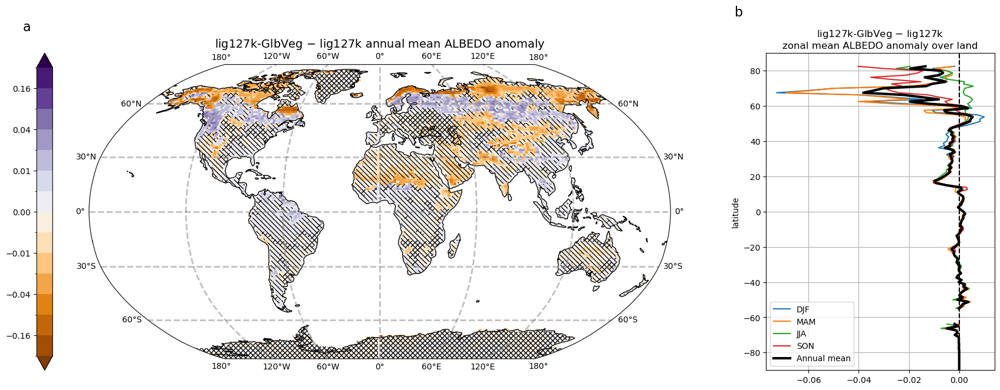

In [78]:
fig = plt.figure(figsize=(35,7))
fig,plot,ax1 = plot_annualmean(model1='lig127k-GlbVeg',
                            model2='lig127k',
                            comp='atm',
                            varname='albedo',
                            unit='',
                            lonname='lon',
                            latname='lat',
                            cmap='PuOr',
                            std=False,
                            ttest=True,
                            ttest_mod=True,
                            field_sigtest='FDR',
                            over_land=True,
                            levels=[-0.32,-0.16,-0.08,-0.04,-0.02,-0.01,-0.005,0,0.005,0.01,0.02,0.04,0.08,0.16,0.32],
                            fig=fig,
                            subplot_no=121,
                            colorbar=False,
                            mask_dwlim=-5,
                            mask_uplim=5,
                            mask_prct=True)
cbar = fig.colorbar(plot, ax=ax1,orientation='vertical',location='left',pad=0.05,extend='both')
cbar.set_label('')
fig,ax2 = plot_zonal_mean_anom(model1='lig127k-GlbVeg',
                                 model2='lig127k',
                                 comp='atm',
                                 varname='albedo',
                                 unit='',
                                 over_land=True,
                                 by_season=True,
                                 label_mode='nomodel',
                                 title='lig127k-GlbVeg $-$ lig127k\nzonal mean ALBEDO anomaly over land',
                                 fig=fig,
                                 subplot_no=164)

for ax, label in zip([ax1,ax2],['a','b']):
    ax.text(-0.1, 1.15, s=label, transform=ax.transAxes,
                fontsize=16, va='top', ha='right')

### TEMPERATURES

Weighted mean = 0.531
Unweighted mean = 1.001
Max = 9.538
Min = -5.069
Plotting tas proxy
Weighted mean = 0.772
Unweighted mean = 1.271
Max = 10.349
Min = -4.593
Plotting tas proxy
Weighted mean = 0.275
Unweighted mean = 0.375
Max = 5.303
Min = -5.218
Plotting sst proxy
Weighted mean = 0.423
Unweighted mean = 0.512
Max = 5.563
Min = -4.498
Plotting sst proxy


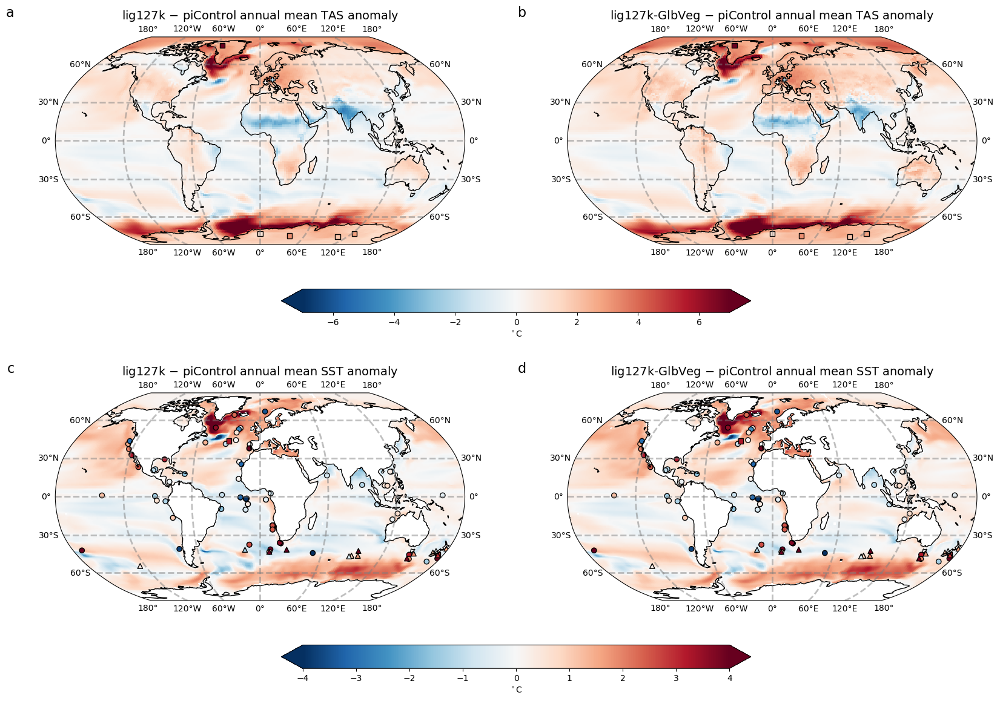

In [116]:
fig = plt.figure(figsize=(20,14))
fig,plot1,ax1 = plot_annualmean(model1='lig127k',
                                model2='piControl',
                                comp='atm',
                                varname='tas',
                                unit='deg C',
                                lonname='lon',
                                latname='lat',
                                cmap='RdBu_r',
                                std=False,
                                ttest=False,
                                ttest_mod=False,
                                ttest_paired=False,
                                field_sigtest='FDR',
                                sig_only=False,
                                insig_bnd=False,
                                vmin=-7,vmax=7,
                                fig=fig,
                                subplot_no=221,
                                colorbar=False,
                                plot_proxy=True)
fig,plot2,ax2 = plot_annualmean(model1='lig127k-GlbVeg',
                                model2='piControl',
                                comp='atm',
                                varname='tas',
                                unit='deg C',
                                lonname='lon',
                                latname='lat',
                                cmap='RdBu_r',
                                std=False,
                                ttest=False,
                                ttest_mod=False,
                                ttest_paired=False,
                                field_sigtest='FDR',
                                sig_only=False,
                                insig_bnd=False,
                                vmin=-7,vmax=7,
                                fig=fig,
                                subplot_no=222,
                                colorbar=False,
                                plot_proxy=True)
cbar = fig.colorbar(plot1, ax=[ax1,ax2],orientation='horizontal',location='bottom',extend='both',shrink=0.5)
cbar.set_label('$^\circ$C')
fig,plot3,ax3 = plot_annualmean(model1='lig127k',
                                model2='piControl',
                                comp='ocn',
                                varname='sst',
                                unit='deg C',
                                lonname='longitude',
                                latname='latitude',
                                cmap='RdBu_r',
                                std=False,
                                ttest=False,
                                ttest_mod=False,
                                ttest_paired=False,
                                field_sigtest='FDR',
                                sig_only=False,
                                insig_bnd=False,
                                vmin=-4,vmax=4,
                                fig=fig,
                                subplot_no=223,
                                colorbar=False,
                                plot_proxy=True)
fig,plot4,ax4 = plot_annualmean(model1='lig127k-GlbVeg',
                                model2='piControl',
                                comp='ocn',
                                varname='sst',
                                unit='deg C',
                                lonname='longitude',
                                latname='latitude',
                                cmap='RdBu_r',
                                std=False,
                                ttest=False,
                                ttest_mod=False,
                                ttest_paired=False,
                                field_sigtest='FDR',
                                sig_only=False,
                                insig_bnd=False,
                                vmin=-4,vmax=4,
                                fig=fig,
                                subplot_no=224,
                                colorbar=False,
                                plot_proxy=True)
cbar = fig.colorbar(plot3, ax=[ax3,ax4],orientation='horizontal',location='bottom',extend='both',shrink=0.5)
cbar.set_label('$^\circ$C')

for ax, label in zip([ax1,ax2,ax3,ax4],['a','b','c','d']):
    ax.text(-0.1, 1.15, s=label, transform=ax.transAxes,
                fontsize=16, va='top', ha='right')
#plt.tight_layout()

Weighted mean = 0.242
Unweighted mean = 0.27
Max = 2.381
Min = -1.306
UNPAIRED MODIFIED t-test for spatial data
FDR
P_FDR = 0.018640882623985243
Number of significant points: 10382 out of 27840 tests.
Plotting tas proxy negative lig127k_bias
Weighted mean = 0.147
Unweighted mean = 0.137
Max = 1.129
Min = -0.5
UNPAIRED MODIFIED t-test for spatial data
FDR
P_FDR = 0.011670302509740414
Number of significant points: 9548 out of 40895 tests.
Plotting sst proxy negative lig127k_bias


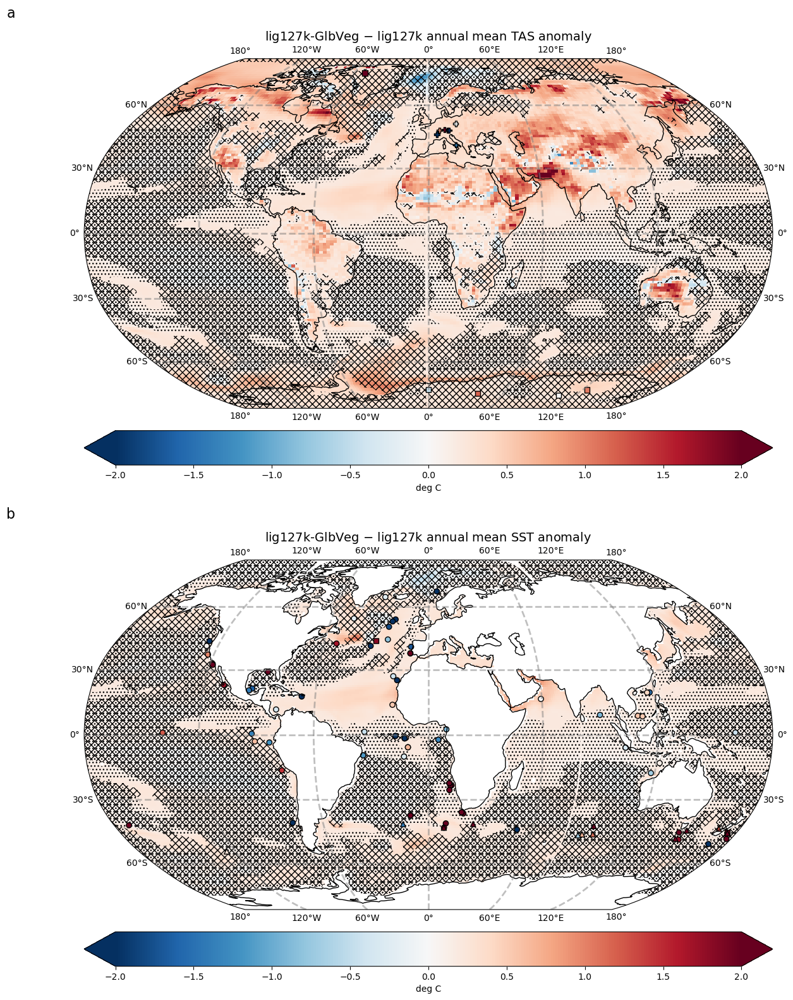

In [105]:
fig = plt.figure(figsize=(12,16))
fig,plot,ax1 = plot_annualmean(model1='lig127k-GlbVeg',
                                model2='lig127k',
                                comp='atm',
                                varname='tas',
                                unit='deg C',
                                lonname='lon',
                                latname='lat',
                                cmap='RdBu_r',
                                std=False,
                                ttest=True,
                                ttest_mod=True,
                                ttest_paired=False,
                                field_sigtest='FDR',
                                sig_only=False,
                                insig_bnd=False,
                                vmin=-2,vmax=2,
                                fig=fig,
                                subplot_no=211,
                                colorbar=True,
                                plot_proxy=True,
                                mask_dwlim=-0.2,
                                mask_uplim=0.2,
                                mask_prct=False)
#cbar = fig.colorbar(plot, ax=ax1,orientation='vertical',location='right',pad=0.05,extend='both')
#cbar.set_label('')
fig,plot2,ax2 = plot_annualmean(model1='lig127k-GlbVeg',
                                model2='lig127k',
                                comp='ocn',
                                varname='sst',
                                unit='deg C',
                                lonname='longitude',
                                latname='latitude',
                                cmap='RdBu_r',
                                std=False,
                                ttest=True,
                                ttest_mod=True,
                                ttest_paired=False,
                                field_sigtest='FDR',
                                sig_only=False,
                                insig_bnd=False,
                                vmin=-2,vmax=2,
                                fig=fig,
                                subplot_no=212,
                                colorbar=True,
                                plot_proxy=True,
                                mask_dwlim=-0.2,
                                mask_uplim=0.2,
                                mask_prct=False)
#cbar = fig.colorbar(plot2, ax=ax2,orientation='vertical',location='right',pad=0.05,extend='both')
#cbar.set_label('')
for ax, label in zip([ax1,ax2],['a','b']):
    ax.text(-0.1, 1.15, s=label, transform=ax.transAxes,
                fontsize=16, va='top', ha='right')
plt.tight_layout()

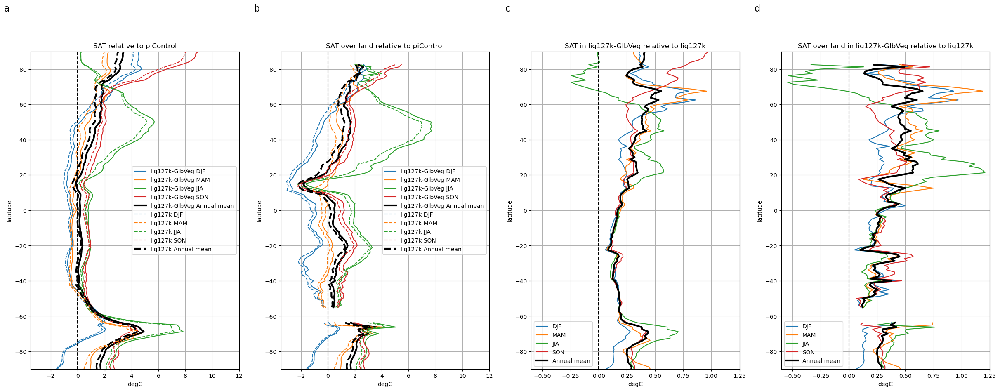

In [77]:
fig = plt.figure(figsize=(30,10))
fig,ax1 = plot_zonal_mean_anom_custom(model1='lig127k-GlbVeg',
                                model2='piControl',
                                comp='atm',
                                varname='tas',
                                unit='degC',
                                model3='lig127k',
                                over_land=False,
                                by_season=True,
                                xmin=-3.5,xmax=12,
                                fig=fig,
                                subplot_no=141,
                                title='SAT relative to piControl',
                                label_mode='simple',
                                data_dict=accessesm_da_adj)
fig,ax2 = plot_zonal_mean_anom_custom(model1='lig127k-GlbVeg',
                                model2='piControl',
                                comp='atm',
                                varname='tas',
                                unit='degC',
                                model3='lig127k',
                                over_land=True,
                                by_season=True,
                                xmin=-3.5,xmax=12,
                                fig=fig,
                                subplot_no=142,
                                title='SAT over land relative to piControl',
                                label_mode='simple',
                                data_dict=accessesm_da_adj)
fig,ax3 = plot_zonal_mean_anom(model1='lig127k-GlbVeg',
                                model2='lig127k',
                                comp='atm',
                                varname='tas',
                                unit='degC',
                                over_land=False,
                                by_season=True,
                                xmin=-0.6,xmax=1.25,
                                fig=fig,
                                subplot_no=143,
                                title='SAT in lig127k-GlbVeg relative to lig127k',
                                label_mode='nomodel')
fig,ax4 = plot_zonal_mean_anom(model1='lig127k-GlbVeg',
                                model2='lig127k',
                                comp='atm',
                                varname='tas',
                                unit='degC',
                                over_land=True,
                                by_season=True,
                                xmin=-0.6,xmax=1.25,
                                fig=fig,
                                subplot_no=144,
                                title='SAT over land in lig127k-GlbVeg relative to lig127k',
                                label_mode='nomodel')

for ax, label in zip([ax1,ax2,ax3,ax4],['a','b','c','d']):
    ax.text(-0.1, 1.15, s=label, transform=ax.transAxes,
                fontsize=16, va='top', ha='right')

### Vegetation

UNPAIRED MODIFIED t-test for spatial data
UNPAIRED MODIFIED t-test for spatial data
FDR
P_FDR = 0.02637319416434639
Number of significant points: 14688 out of 27840 tests.
FDR
P_FDR = 0.015050368537735318
Number of significant points: 8386 out of 27840 tests.
UNPAIRED MODIFIED t-test for spatial data
UNPAIRED MODIFIED t-test for spatial data
FDR
P_FDR = 0.032205838939996505
Number of significant points: 17939 out of 27840 tests.
FDR
P_FDR = 0.017618313034685168
Number of significant points: 9818 out of 27840 tests.
UNPAIRED MODIFIED t-test for spatial data
UNPAIRED MODIFIED t-test for spatial data
FDR
P_FDR = 0.02637319416434639
Number of significant points: 14688 out of 27840 tests.
FDR
P_FDR = 0.015050368537735318
Number of significant points: 8386 out of 27840 tests.
UNPAIRED MODIFIED t-test for spatial data
UNPAIRED MODIFIED t-test for spatial data
FDR
P_FDR = 0.032205838939996505
Number of significant points: 17939 out of 27840 tests.
FDR
P_FDR = 0.017618313034685168
Number of sig

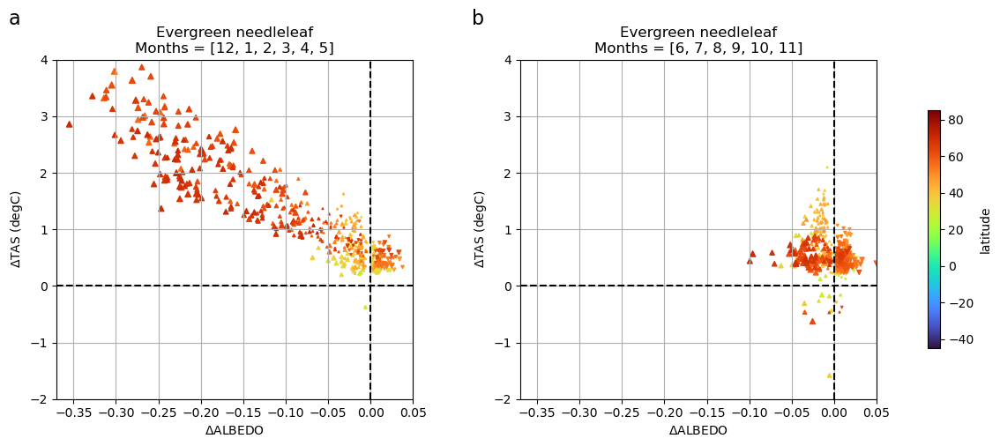

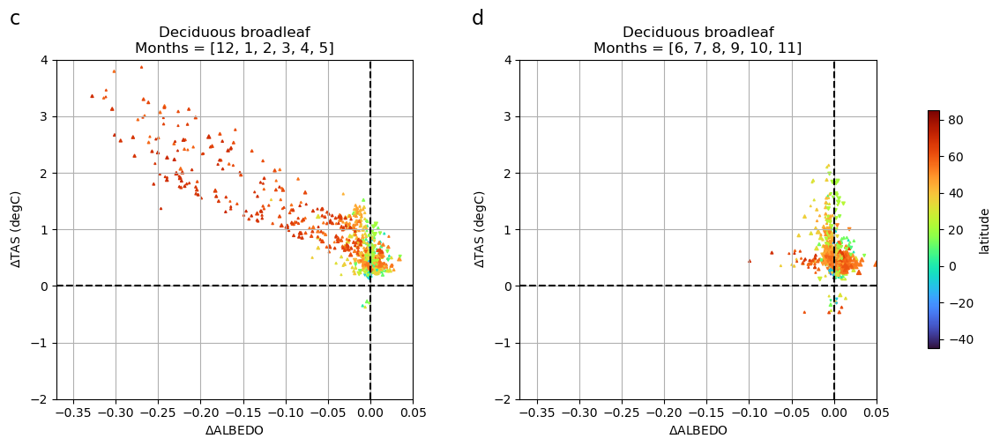

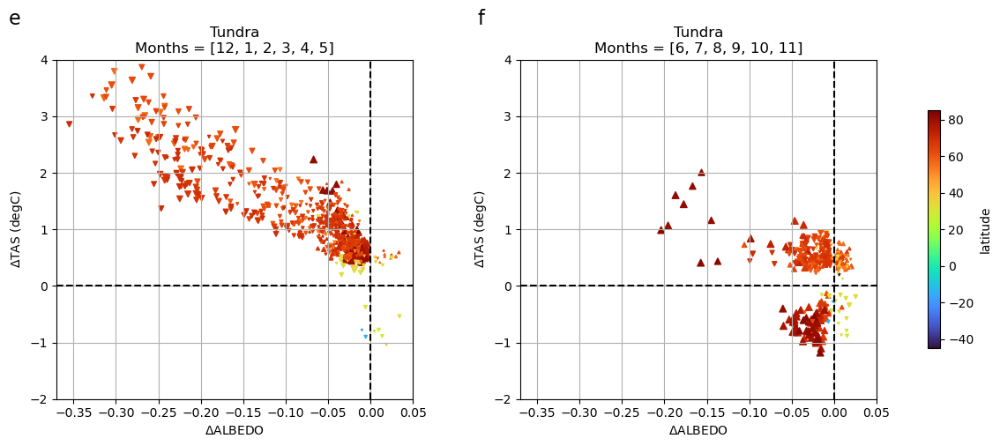

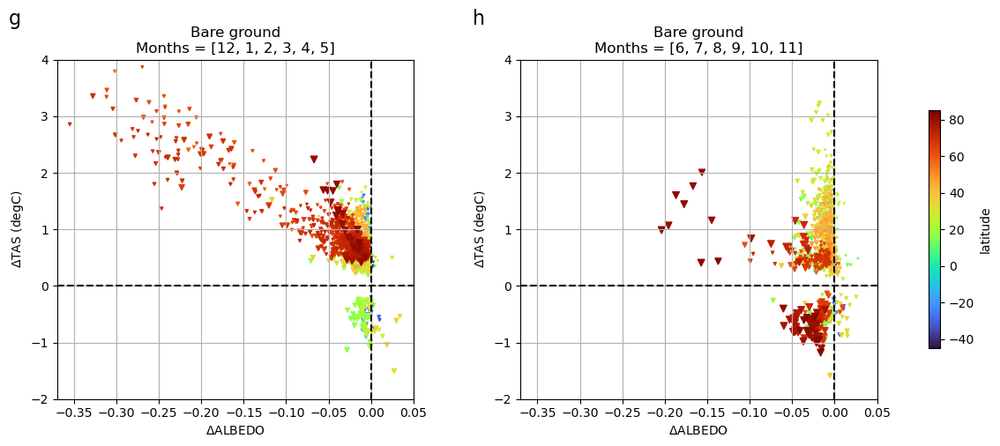

In [64]:
#for pseudo_level in [1,2,3,4,5,6,7,8,14]:
for (pseudo_level,[vmin,vmax],labels) in zip([1,4,8,14],[[-20,70],[25,85],[-45,85],[-90,90]],[['a','b'],['c','d'],['e','f'],['g','h']]):
    fig, axs = plot_relationship_with_veg_halfyr_v2(model1='lig127k-GlbVeg',
                                                  model2='lig127k',
                                                  varname1='albedo',
                                                  varname2='tas',
                                                  unit1='',
                                                  unit2='degC',
                                                  pseudo_level=pseudo_level,
                                                  surf_frac_null=0.05,
                                                  sig_only=True,
                                                  ttest_mod=True,
                                                  field_sigtest='FDR',
                                                  cmap='turbo',
                                                  ymin=-2,ymax=4,
                                                  xmin=-0.37,xmax=0.05,
                                                  vmin=-45,vmax=85,
                                                  )
    for ax,label in zip(axs,labels):
        ax.text(-0.1, 1.15, s=label, transform=ax.transAxes,
                    fontsize=16, va='top', ha='right')

### Sea-ice

Text(0.5, 1.0, 'Arctic sea-ice area')

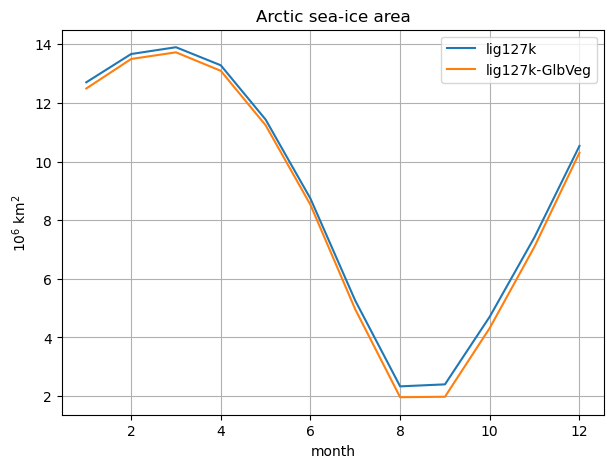

In [95]:
plt.figure(figsize=(7,5))
for model in ['lig127k','lig127k-GlbVeg']:
    plt.plot(accessesm_da[model]['ice']['aice']['month'].month,
             ((accessesm_da[model]['ice']['aice']['month']
                   .where(accessesm_da[model]['ice']['aice']['month'])*ice_cellarea)
                   .where(accessesm_da[model]['ice']['aice']['month'].nj>150,drop=True).sum(['ni','nj'])/1e12),
             label=model)
plt.legend()
plt.grid()
plt.xlabel('month')
plt.ylabel('$10^6$ km$^2$')
plt.title('Arctic sea-ice area')

### PRECIP

Weighted mean = 0.368
Unweighted mean = 0.341
Max = 24.442
Min = -8.637
UNPAIRED MODIFIED t-test for spatial data
FDR
P_FDR = 0.002179249391573201
Number of significant points: 1215 out of 27840 tests.


(<Figure size 1300x1000 with 2 Axes>,
 <GeoAxes: title={'center': 'lig127k-GlbVeg $-$ lig127k annual mean PRECIP anomaly'}>)

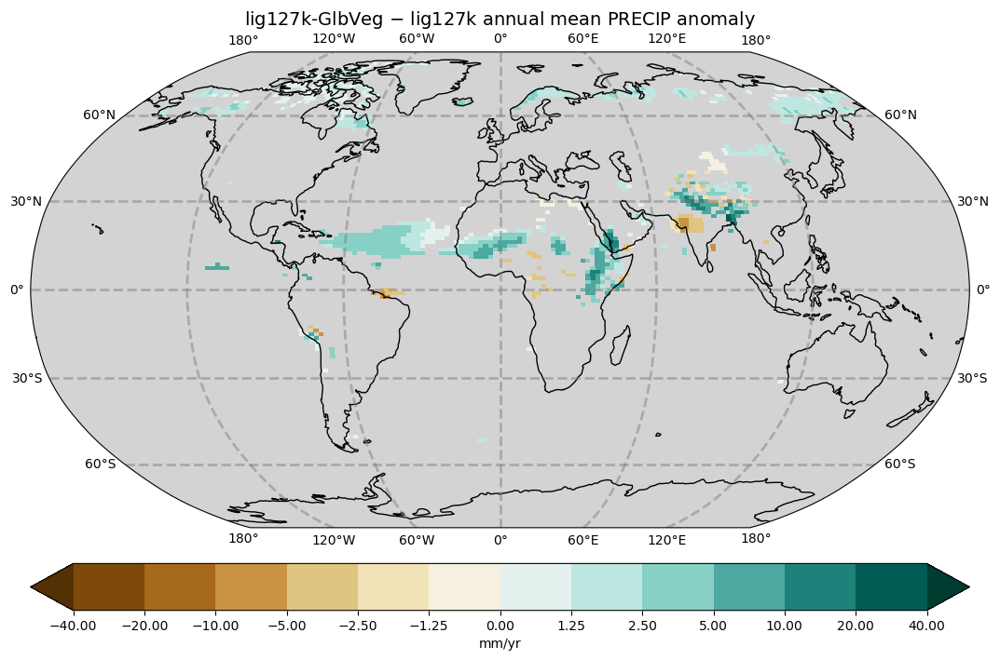

In [103]:
plot_annualmean(model1='lig127k-GlbVeg',
                model2='lig127k',
                comp='atm',
                varname='precip',
                unit='mm/yr',
                lonname='lon',
                latname='lat',
                cmap='BrBG',
                std=False,
                ttest=True,
                ttest_mod=True,
                field_sigtest='FDR',
                sig_only=True,
                scale=86400*365,
                levels=[x*100 for x in [-4,-2,-1,-0.5,-0.25,-0.125,0,0.125,0.25,0.5,1,2,4]],
                #vmin=-600,vmax=600
                mask_dwlim=-5,
                mask_uplim=5,
                mask_prct=True
                )

### surface energy budget

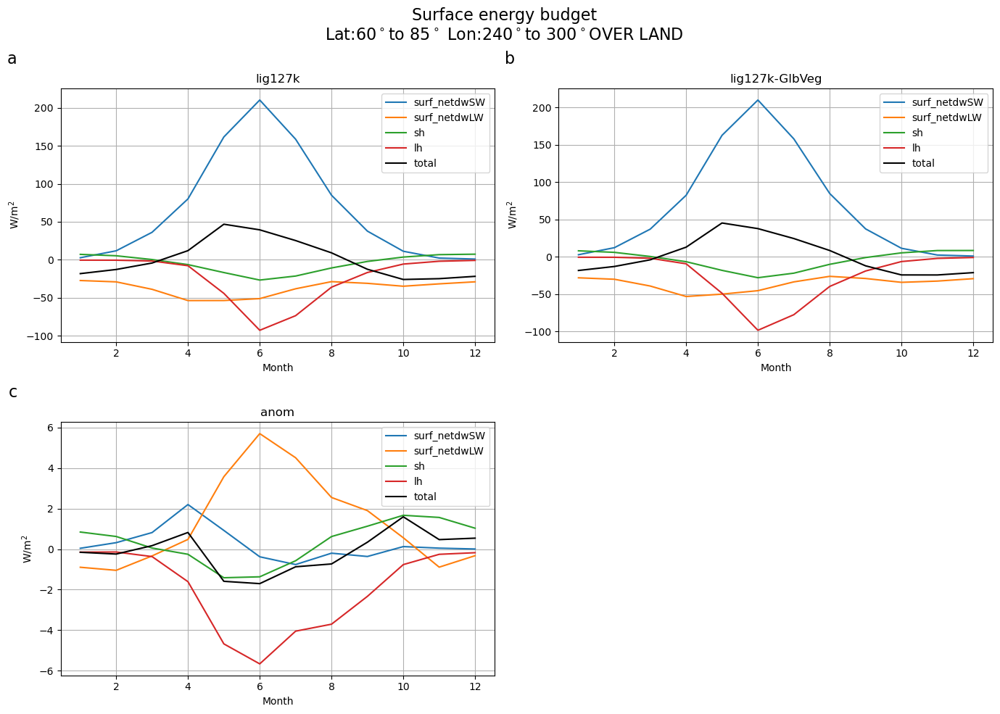

In [166]:
south_latbnd = 60
north_latbnd = 85
west_lonbnd = 240
east_lonbnd = 300
over_land = True

fig, axs = plt.subplots(2,2,figsize=(14,10))

for ax,model in zip(axs.ravel(),['lig127k','lig127k-GlbVeg','anom']):
    for varname in ['surf_netdwSW','surf_netdwLW','sh','lh','surf_energy_flux']:
        data = accessesm_da[model]['atm'][varname]['month']
        if over_land: 
            data = data*atm_cellarea*lsm
            data = data.sel(lat=slice(south_latbnd,north_latbnd),
                            lon=slice(west_lonbnd,east_lonbnd)).sum(['lat','lon'])
            data = data/(atm_cellarea*lsm).sel(lat=slice(south_latbnd,north_latbnd),
                                               lon=slice(west_lonbnd,east_lonbnd)).sum(['lat','lon'])
            land_str = 'OVER LAND'
        else:
            data = data*atm_cellarea
            data = data.sel(lat=slice(south_latbnd,north_latbnd),
                            lon=slice(west_lonbnd,east_lonbnd)).sum(['lat','lon'])
            data = data/atm_cellarea.sel(lat=slice(south_latbnd,north_latbnd),
                                         lon=slice(west_lonbnd,east_lonbnd)).sum(['lat','lon'])
            land_str = ''
        if (varname == 'sh') or (varname == 'lh'):
            data = -data
        if varname == 'surf_energy_flux':
            ax.plot(data['month'],data,label='total',color='k')
        else:
            ax.plot(data['month'],data,label=varname)
    
    ax.set_title(model)
    ax.grid()
    ax.legend()
    ax.set_ylabel('W/m$^2$')
    ax.set_xlabel('Month')


labels=['a','b','c']
for ax, i in zip(axs.ravel(),range(3)):
    ax.text(-0.1, 1.15, s=labels[i], transform=ax.transAxes,
                fontsize=16, va='top', ha='right')

fig.suptitle('Surface energy budget\nLat:{}$^\circ$to {}$^\circ$ Lon:{}$^\circ$to {}$^\circ${}'.format(south_latbnd,north_latbnd,west_lonbnd,east_lonbnd,land_str),fontsize=16)
fig.tight_layout()

ax=axs.ravel()[3].axis('off')

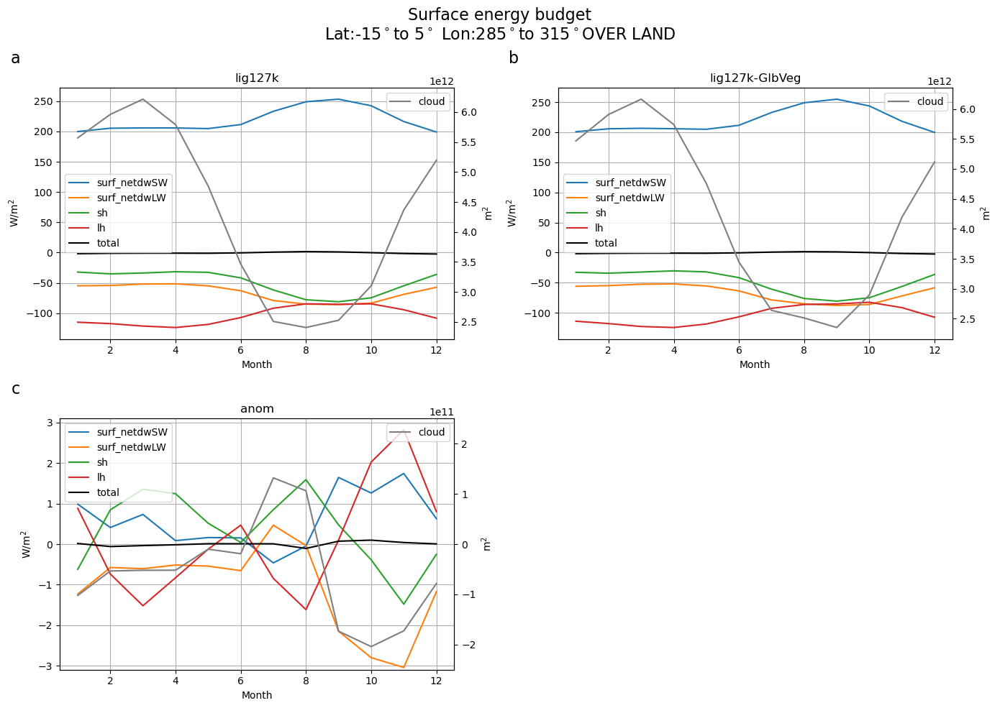

In [164]:
south_latbnd = -15
north_latbnd = 5
west_lonbnd = 285
east_lonbnd = 315
over_land = True

fig, axs = plt.subplots(2,2,figsize=(14,10))

for i, (ax,model) in enumerate(zip(axs.ravel(),['lig127k','lig127k-GlbVeg','anom'])):
    ax2 = ax.twinx()
    for varname in ['surf_netdwSW','surf_netdwLW','sh','lh','surf_energy_flux','cloud']:
        data = accessesm_da[model]['atm'][varname]['month']
        if over_land:
            land_str = 'OVER LAND'
            data = data*atm_cellarea*lsm
            data = data.sel(lat=slice(south_latbnd,north_latbnd),
                            lon=slice(west_lonbnd,east_lonbnd)).sum(['lat','lon'])
            if varname != 'cloud':
                data = data/(atm_cellarea*lsm).sel(lat=slice(south_latbnd,north_latbnd),
                                                   lon=slice(west_lonbnd,east_lonbnd)).sum(['lat','lon'])
            
        else:
            land_str = ''
            data = data*atm_cellarea
            data = data.sel(lat=slice(south_latbnd,north_latbnd),
                            lon=slice(west_lonbnd,east_lonbnd)).sum(['lat','lon'])
            if varname != 'cloud':
                data = data/atm_cellarea.sel(lat=slice(south_latbnd,north_latbnd),
                                             lon=slice(west_lonbnd,east_lonbnd)).sum(['lat','lon'])
            
        if (varname == 'sh') or (varname == 'lh'):
            data = -data
        if varname == 'surf_energy_flux':
            ax.plot(data['month'],data,label='total',color='k')
        elif varname =='cloud':
            ax2.plot(data['month'],data,label=varname,color='tab:grey')
        else:
            ax.plot(data['month'],data,label=varname)
    
    
    ax.set_title(model)
    ax.grid()
    ax.legend()
    ax2.legend()
    ax.set_ylabel('W/m$^2$')
    ax2.set_ylabel('m$^2$')
    ax.set_xlabel('Month')
    if i == 2:
        align_yaxis(ax, 0, ax2, 0)
        ax.set_ylim(-3.1,3.1)
        ax2.set_ylim(-2.5*1e11,2.5*1e11)

labels=['a','b','c']
for ax, i in zip(axs.ravel(),range(3)):
    ax.text(-0.1, 1.15, s=labels[i], transform=ax.transAxes,
                fontsize=16, va='top', ha='right')

fig.suptitle('Surface energy budget\nLat:{}$^\circ$to {}$^\circ$ Lon:{}$^\circ$to {}$^\circ${}'.format(south_latbnd,north_latbnd,west_lonbnd,east_lonbnd,land_str),fontsize=16)
fig.tight_layout()

ax=axs.ravel()[3].axis('off')

### MSLP/geopotential height

Weighted mean = 1.132
Unweighted mean = 0.888
Max = 33.564
Min = -49.087
Two Sample MODIFIED t-test for spatial data
FDR
P_FDR = 7.734553463912517e-06
Number of significant points: 5 out of 24863 tests.
Weighted mean = 1.182
Unweighted mean = 1.721
Max = 44.365
Min = -66.497
Two Sample MODIFIED t-test for spatial data
FDR
P_FDR = 0.002228898417145261
Number of significant points: 1113 out of 24852 tests.
Weighted mean = 1.134
Unweighted mean = 1.567
Max = 32.908
Min = -83.667
Two Sample MODIFIED t-test for spatial data
FDR
P_FDR = 0.005873863118360445
Number of significant points: 2921 out of 24839 tests.
Weighted mean = 1.162
Unweighted mean = 1.426
Max = 76.18
Min = -35.145
Two Sample MODIFIED t-test for spatial data
FDR
P_FDR = 0.0033006211521629286
Number of significant points: 1646 out of 24851 tests.


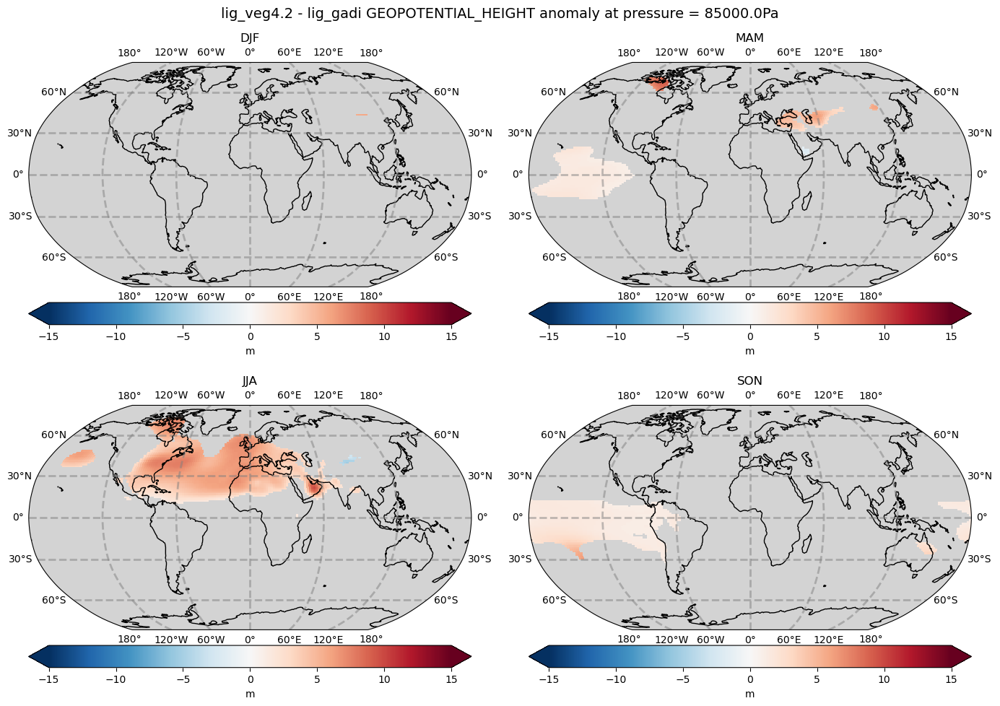

In [220]:
plot_ymonmean_by_season(model1='lig127k-GlbVeg',
                         model2='lig127k',
                         comp='atm',
                         varname='geopotential_height',
                         unit='m',
                         lonname='lon_u',
                         latname='lat_v',
                         zname='pressure',
                         zind=2,
                         cmap='RdBu_r',
                         ttest=True,
                         ttest_mod = True,
                         field_sigtest='FDR',
                         sig_only=True,
                         vmin=-15,vmax=15
                       )

### WINDS

Weighted mean = -0.128
Unweighted mean = -0.119
Max = 1.822
Min = -4.01
UNPAIRED MODIFIED t-test for spatial data
FDR
P_FDR = 0.010604813960982465
Number of significant points: 5876 out of 27648 tests.


(<Figure size 1300x1000 with 2 Axes>,
 <GeoAxes: title={'center': 'lig127k-GlbVeg $-$ lig127k annual mean 10M_WIND_SPEED anomaly'}>)

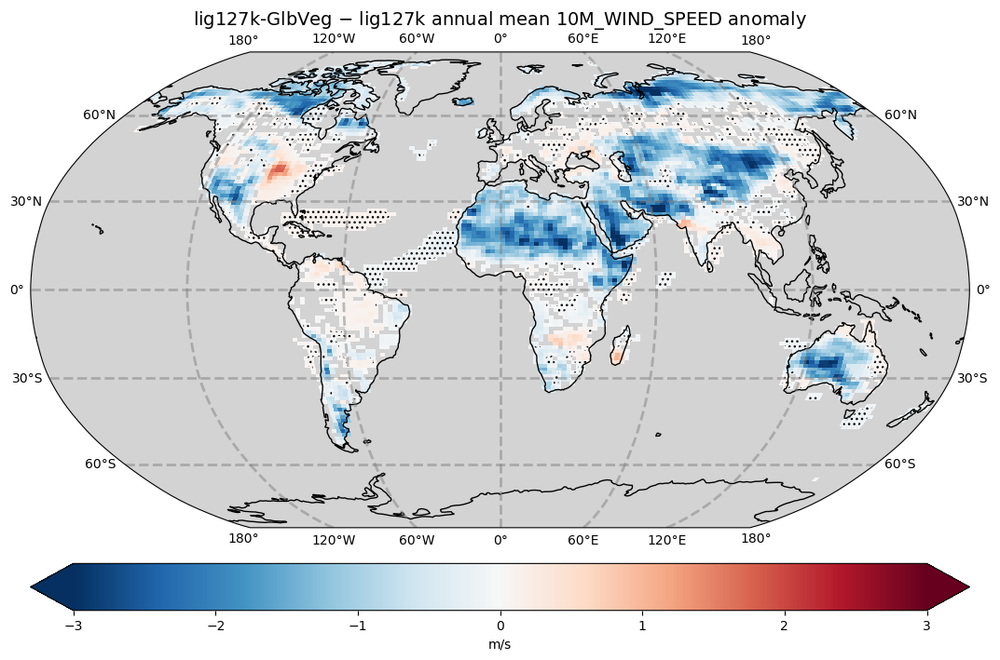

In [102]:
plot_annualmean(model1='lig127k-GlbVeg',
                 model2='lig127k',
                 comp='atm',
                 varname='10m_wind_speed',
                 unit='m/s',
                 lonname='lon_u',
                 latname='lat_v',
                 cmap='RdBu_r',
                 ttest=True,
                 ttest_mod=True,
                 sig_only=True,
                 field_sigtest='FDR',
                 vmin=-3,vmax=3,
                 mask_dwlim=-5,
                 mask_uplim=5,
                 mask_prct=True)

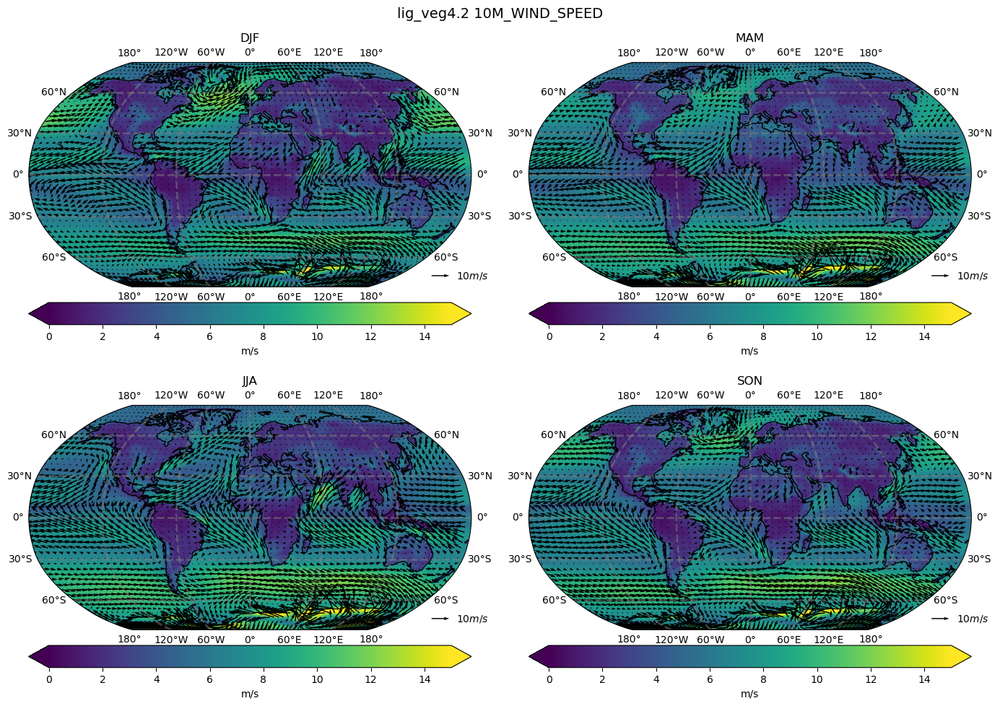

In [315]:
plot_ymonmean_by_season_winds(model1='lig127k-GlbVeg',
                             unit='m/s',
                             cmap='viridis',
                             vmin=0,vmax=15,
                             quiver_scale=250,
                             skip = slice(None,None,3),
                             quiverkey_mag=10)

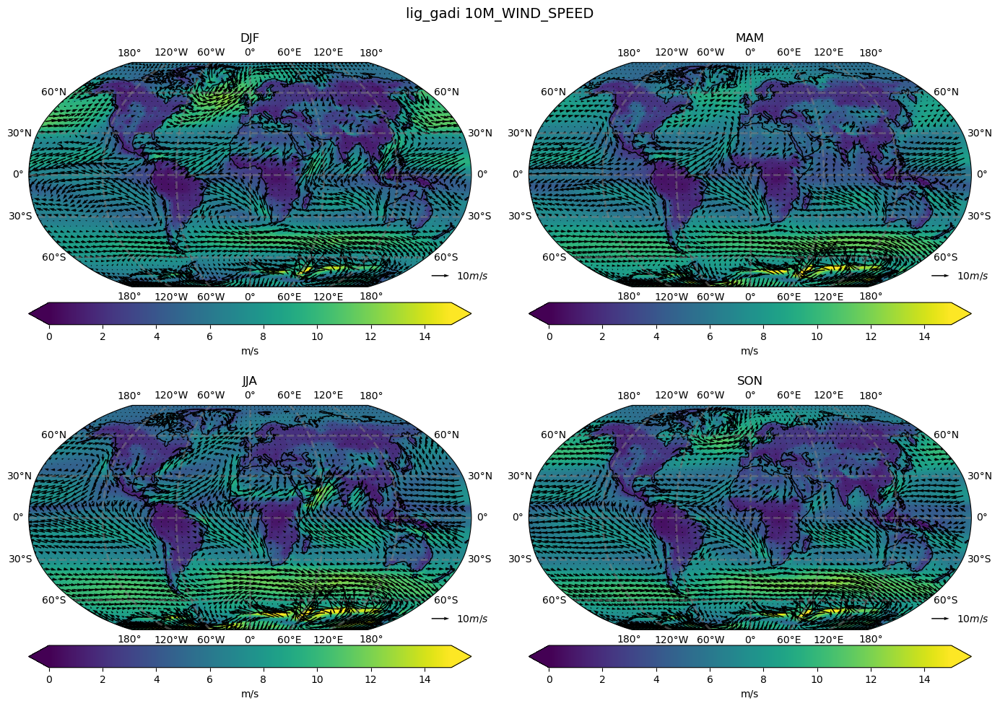

In [313]:
plot_ymonmean_by_season_winds(model1='lig127k',
                             unit='m/s',
                             cmap='viridis',
                             vmin=0,vmax=15,
                             quiver_scale=250,
                             skip = slice(None,None,3),
                             quiverkey_mag=10)

### ITCZ

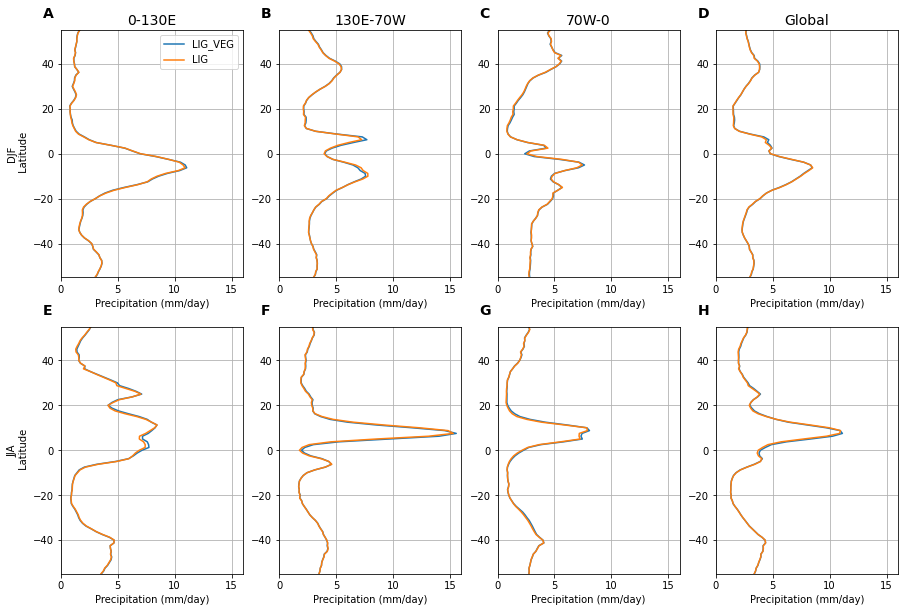

In [54]:
ITCZ_defs = [[0, 130],
             [130, 290],
             [290, 360],
             [0, 360]]

fig, axs = plt.subplots(2,4, figsize=(15,10))
fig.subplots_adjust(hspace=0.2,wspace=0.2)

for i, ITCZ_def in enumerate(ITCZ_defs):
    
    this_ligveg = (accessesm_da['lig127k-GlbVeg']['atm']['precip']['season']
                   .where((accessesm_da['lig127k-GlbVeg']['atm']['precip']['season'].lon>=ITCZ_def[0])
                          &(accessesm_da['lig127k-GlbVeg']['atm']['precip']['season'].lon<=ITCZ_def[1]),drop=True)
                   .mean('lon'))
    this_lig = (accessesm_da['lig127k']['atm']['precip']['season']
                   .where((accessesm_da['lig127k']['atm']['precip']['season'].lon>=ITCZ_def[0])
                          &(accessesm_da['lig127k']['atm']['precip']['season'].lon<=ITCZ_def[1]),drop=True)
                   .mean('lon'))
    
    for ax, data, data2 in zip(axs.ravel()[i:8:4],this_ligveg, this_lig):
        cs = ax.plot(data*60*60*24, data.lat)
        cs2 = ax.plot(data2*60*60*24, data2.lat)
        ax.set_xlim(0, 16)
        ax.set_ylim(-55, 55)
        ax.set_xlabel('Precipitation (mm/day)')
        ax.grid()
        #ax.set_title("%s" % data2.season.values, fontsize=18)
        
axs.ravel()[0].set_ylabel('DJF\n Latitude')
axs.ravel()[4].set_ylabel('JJA\n Latitude')
axs.ravel()[0].legend(['LIG_VEG','LIG'])
axs.ravel()[0].set_title('0-130E', fontsize=14)
axs.ravel()[1].set_title('130E-70W', fontsize=14)
axs.ravel()[2].set_title('70W-0', fontsize=14)
axs.ravel()[3].set_title('Global', fontsize=14)

for i,string in zip([0,1,2,3,4,5,6,7],['A','B','C','D','E','F','G','H']):
    axs.ravel()[i].text(-0.1, 1.05, string, transform=axs.ravel()[i].transAxes, 
            size=14, weight='bold')
#fig.suptitle('Zonally ave. precip.\n',fontsize=16)
plt.show()

### monsoon

Text(0.5, 1.0, 'Monsoon regions')

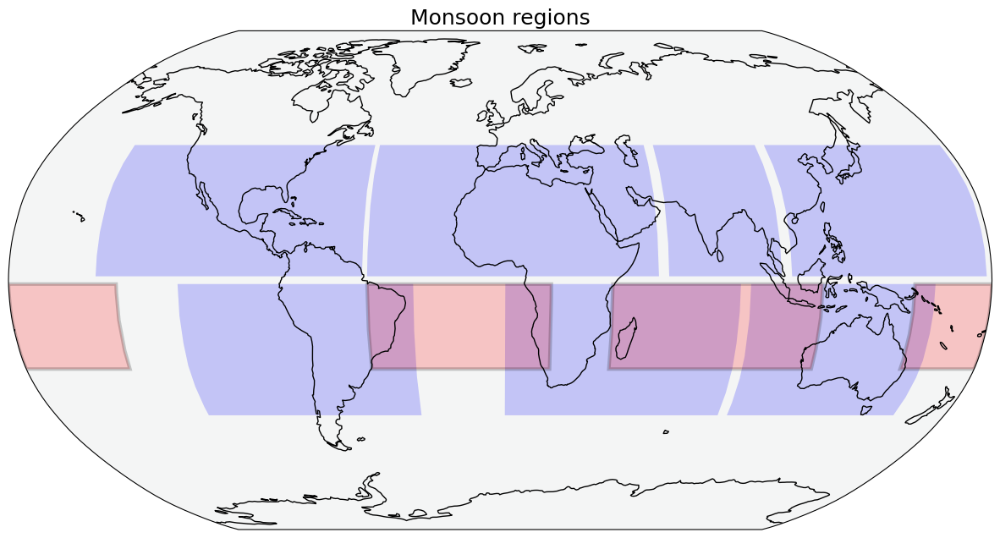

In [75]:
#
plt.figure(figsize=(15,10))
cmap = plt.cm.get_cmap("BrBG")

ax1 = plt.axes(projection=ccrs.Robinson())
plot1 = ax1.pcolormesh(accessesm_da['anom']['atm']['precip']['month'].lon,
                       accessesm_da['anom']['atm']['precip']['month'].lat,
                       accessesm_da['anom']['atm']['precip']['month'].mean('month')*0,
                       transform=ccrs.PlateCarree(),
                       cmap=cmap,vmin=-1,vmax=1
                      )

for monsoon in monsoons[list(monsoons.keys())[0]]:
    monsoon_pr = monsoons[list(monsoons.keys())[0]][monsoon]['precip']
    
    if np.all(np.diff(np.diff(monsoon_pr.lon.values))==0):
        width=monsoon_pr.lon[-1]-monsoon_pr.lon[0]
        ll_lon = monsoon_pr.lon[0]
    else:
        tmp_lon = np.sort(np.where(monsoon_pr.lon.values <= 180,
                                   monsoon_pr.lon.values,
                                   monsoon_pr.lon.values-360))+360
        width=tmp_lon[-1]-tmp_lon[0]
        ll_lon = tmp_lon[0]
    
    ax1.add_patch(mpatches.Rectangle(xy=[ll_lon,monsoon_pr.lat[0]],
                                         width=width,
                                         height=monsoon_pr.lat[-1]-monsoon_pr.lat[0],
                                         facecolor='blue',
                                         alpha=0.2,
                                         transform=ccrs.PlateCarree()))
    
for monsoon_ocn in monsoons_ocn[list(monsoons_ocn.keys())[0]]:
    monsoon_ocn_pr = monsoons_ocn[list(monsoons_ocn.keys())[0]][monsoon_ocn]['precip']
    
    if np.all(np.diff(np.diff(monsoon_ocn_pr.lon.values))==0):
        width=monsoon_ocn_pr.lon[-1]-monsoon_ocn_pr.lon[0]
        ll_lon = monsoon_ocn_pr.lon[0]
    else:
        tmp_lon = np.sort(np.where(monsoon_ocn_pr.lon.values <= 180,
                                   monsoon_ocn_pr.lon.values,
                                   monsoon_ocn_pr.lon.values-360))+360
        width=tmp_lon[-1]-tmp_lon[0]
        ll_lon = tmp_lon[0]
    
    ax1.add_patch(mpatches.Rectangle(xy=[ll_lon,monsoon_ocn_pr.lat[0]],
                                         width=width,
                                         height=monsoon_ocn_pr.lat[-1]-monsoon_ocn_pr.lat[0],
                                         facecolor='red',
                                         edgecolor='black',
                                         linewidth=3,
                                         alpha=0.2,
                                         transform=ccrs.PlateCarree()))

#Vertical lines
#Atlantic
#ax1.plot([220, 220], [-90, 90], color='k', linestyle='-', linewidth=2,transform=ccrs.PlateCarree())
#ax1.plot([150, 150], [0, -90], color='k', linestyle='-', linewidth=2,transform=ccrs.PlateCarree())
#Indo-Pacific
#ax1.plot([50, 50], [-90, 90], color='k', linestyle='-', linewidth=2,transform=ccrs.PlateCarree())
#ax1.plot([285, 285], [-90, 90], color='k', linestyle='-', linewidth=2,transform=ccrs.PlateCarree())

ax1.add_feature(cfeature.COASTLINE)
ax1.set_title('Monsoon regions', fontsize=18)


In [76]:
#ABOVE THRESHOLD 2.5mm/day
mask = 'land' #ocean or land or all
i=0
for monsoon_short_title in monsoon_defs:
    
    monsoon_ligveg = monsoons['lig127k-GlbVeg'][monsoon_short_title]['precip']
    monsoon_lig = monsoons['lig127k'][monsoon_short_title]['precip']
    hemi = monsoon_defs[monsoon_short_title]['hemi']
    
    print(monsoon_defs[monsoon_short_title]['title'],':\n',
            'Pav:','%.1f'%(monsoon_prct_change(monsoon_ligveg,monsoon_lig,hemi,mask)[0].values),'%\n',
            'Aav:','%.1f'%(monsoon_prct_change(monsoon_ligveg,monsoon_lig,hemi,mask)[1].values),'%\n',
            'Totwater:','%.1f'%(monsoon_prct_change(monsoon_ligveg,monsoon_lig,hemi,mask)[2].values),'%')


East African Monsoon :
 Pav: -0.7 %
 Aav: 1.8 %
 Totwater: 1.2 %
Australian Monsoon :
 Pav: 0.8 %
 Aav: 8.4 %
 Totwater: 9.3 %
South American Monsoon :
 Pav: -1.3 %
 Aav: -1.3 %
 Totwater: -2.6 %
North African Monsoon :
 Pav: -0.1 %
 Aav: 5.3 %
 Totwater: 5.2 %
North American Monsoon :
 Pav: 1.5 %
 Aav: -0.9 %
 Totwater: 0.5 %
South Asia Monsoon :
 Pav: 3.8 %
 Aav: -1.5 %
 Totwater: 2.3 %
East Asia Monsoon :
 Pav: -0.6 %
 Aav: 5.6 %
 Totwater: 5.0 %


In [77]:
monsoon_ocn_defs

{'SAO': {'title': 'South Atlantic Ocean',
  'bnds': [-50, 20, -30, 0],
  'hemi': 'south'},
 'IND': {'title': 'Indian Ocean', 'bnds': [40, 120, -30, 0], 'hemi': 'south'},
 'WPO': {'title': 'Western to Central Equatorial Pacific Ocean',
  'bnds': [150, -140, -30, 0],
  'hemi': 'south'}}

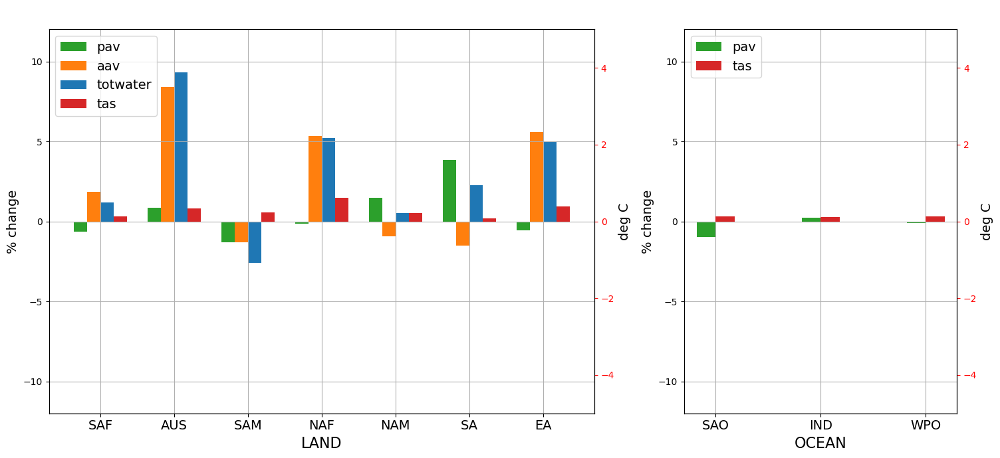

In [50]:
x = np.arange(len(monsoon_defs.keys()))  # the label locations
width = 0.18  # the width of the bars

#fig, axs = plt.subplots(1,2,figsize=(15,7),sharey=True)

fig = plt.figure(figsize=(15,7))
gs = gridspec.GridSpec(nrows=1, ncols=2,width_ratios=[2, 1],hspace=0)

ax1 = fig.add_subplot(gs[0])

#ax = axs.ravel()[0]
ax2 = ax1.twinx()
i=0
for monsoon_short_title in monsoon_defs:
    
    monsoon_ligveg = monsoons['lig127k-GlbVeg'][monsoon_short_title]['precip']
    monsoon_lig = monsoons['lig127k'][monsoon_short_title]['precip']
    monsoon_tas_ligveg = monsoons['lig127k-GlbVeg'][monsoon_short_title]['tas']
    monsoon_tas_lig = monsoons['lig127k'][monsoon_short_title]['tas']
    hemi = monsoon_defs[monsoon_short_title]['hemi']
    
    if hemi == 'north':
        summer_mon = [5,6,7,8,9]
        winter_mon = [11,12,1,2,3]
    elif hemi == 'south':
        summer_mon = [11,12,1,2,3]
        winter_mon = [5,6,7,8,9]
    
    data_1 = monsoon_prct_change(monsoon_ligveg,monsoon_lig,hemi,'land')[0].values
    data_2 = monsoon_prct_change(monsoon_ligveg,monsoon_lig,hemi,'land')[1].values
    data_3 = monsoon_prct_change(monsoon_ligveg,monsoon_lig,hemi,'land')[2].values
    data_4 = monsoon_tas_ligveg.where((ar(monsoon_ligveg,hemi)*lsm)>2.5)\
                         .sel(month=summer_mon).mean(['lon','lat','month'])-\
                        monsoon_tas_lig.where((ar(monsoon_lig,hemi)*lsm)>2.5)\
                          .sel(month=summer_mon).mean(['lon','lat','month'])
    p1 = ax1.bar(x[i] - 1.5*width, data_1, width, color='tab:green')
    p2 = ax1.bar(x[i] - 0.5*width, data_2, width, color='tab:orange')
    p3 = ax1.bar(x[i] + 0.5*width, data_3, width, color='tab:blue')
    p4 = ax2.bar(x[i] + 1.5*width, data_4, width, color='tab:red')
    i=i+1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax1.set_ylim(-12,12)
ax1.set_ylabel('% change', fontsize=14)
ax2.set_ylabel('deg C', fontsize=14)
ax2.tick_params(axis='y', colors='red')
ax1.set_xlabel('LAND', fontsize=16)
ax1.set_xticks(x)
ax1.set_xticklabels(monsoon_defs.keys(), fontsize=14)
ax1.legend((p1,p2,p3,p4),('pav','aav','totwater','tas'), fontsize=14, loc='upper left')
ax1.grid()

x = np.arange(len(monsoon_ocn_defs.keys()))
ax3 = fig.add_subplot(gs[1],sharey=ax1)
#ax = axs.ravel()[1]
ax4 = ax3.twinx()
i=0



for monsoon_ocn_short_title in monsoon_ocn_defs:
    
    ocean_ligveg = monsoons_ocn['lig127k-GlbVeg'][monsoon_ocn_short_title]['precip']
    ocean_lig = monsoons_ocn['lig127k'][monsoon_ocn_short_title]['precip']
    ocean_tas_ligveg = monsoons_ocn['lig127k-GlbVeg'][monsoon_ocn_short_title]['tas']
    ocean_tas_lig = monsoons_ocn['lig127k'][monsoon_ocn_short_title]['tas']
    hemiv = monsoon_ocn_defs[monsoon_ocn_short_title]['hemi']
    
    if hemi == 'north':
        summer_mon = [5,6,7,8,9]
        winter_mon = [11,12,1,2,3]
    elif hemi == 'south':
        summer_mon = [11,12,1,2,3]
        winter_mon = [5,6,7,8,9]
    
    data_1 = prct_change((ocean_ligveg*om).sel(month=summer_mon).mean(['lat','lon','month']),
                        (ocean_lig*om).sel(month=summer_mon).mean(['lat','lon','month']))
    data_4 = (ocean_tas_ligveg*om).sel(month=summer_mon).mean(['lon','lat','month'])-\
                        (ocean_tas_lig*om).sel(month=summer_mon).mean(['lon','lat','month'])
    
    p1 = ax3.bar(x[i] - 0.5*width, data_1, width, color='tab:green')
    #p2 = ax3.bar(x[i] - 0.5*width, data_2, width, color='tab:orange')
    #p3 = ax3.bar(x[i] + 0.5*width, data_3, width, color='tab:blue')
    p4 = ax4.bar(x[i] + 0.5*width, data_4, width, color='tab:red')
    i=i+1
    
# Add some text for labels, title and custom x-axis tick labels, etc.
ax3.set_ylim(-12,12)
ax3.set_xlabel('OCEAN', fontsize=16)
ax3.set_ylabel('% change', fontsize=14)
ax3.set_xticks(x)
ax3.set_xticklabels(monsoon_ocn_defs.keys(), fontsize=14)
ax3.legend((p1,p4),('pav','tas'), fontsize=14, loc='upper left')
ax3.grid()

ax3.set_title(' ', fontsize=24)
fig.tight_layout()
#fig.suptitle('Changes in precip. in monsoon and ocean regions during monsoon season',fontsize=20)

# To align both y-axes
ax2.set_ylim(-3,7)
ax4.set_ylim(-3,7)
ax4.set_ylabel('deg C', fontsize=14)
ax4.tick_params(axis='y', colors='red')
align_yaxis(ax1, 0, ax2, 0)
align_yaxis(ax3, 0, ax4, 0)

plt.show()


In [78]:
#nlig_ar = ar(pr_lig_month,'north').loc[dict(latitude=la[(la > 0)])]
#nliggadi_ar = ar(pr_liggadi_month,'north').loc[dict(latitude=la[(la > 0)])]
#slig_ar = ar(pr_lig_month,'south').loc[dict(latitude=la[(la < 0)])]
#sliggadi_ar = ar(pr_liggadi_month,'south').loc[dict(latitude=la[(la < 0)])]
nligveg_ar = ar(accessesm_da['lig127k-GlbVeg']['atm']['precip']['month'],'north')
nlig_ar = ar(accessesm_da['lig127k']['atm']['precip']['month'],'north')
sligveg_ar = ar(accessesm_da['lig127k-GlbVeg']['atm']['precip']['month'],'south')
slig_ar = ar(accessesm_da['lig127k']['atm']['precip']['month'],'south')
nligveg_ar.loc[dict(lat=la[(la <= 0)])] = 0
nlig_ar.loc[dict(lat=la[(la <= 0)])] = 0
sligveg_ar.loc[dict(lat=la[(la >= 0)])] = 0
slig_ar.loc[dict(lat=la[(la >= 0)])] = 0

# New monsoon criteria: Monsoon precip intensity (MPI) > 0.55
# MPI = ar/annual mean
nligveg_ar = xr.where((nligveg_ar/(accessesm_da['lig127k-GlbVeg']['atm']['precip']['month'].mean('month')*60*60*24))>0.55,nligveg_ar,0)
sligveg_ar = xr.where((sligveg_ar/(accessesm_da['lig127k-GlbVeg']['atm']['precip']['month'].mean('month')*60*60*24))>0.55,sligveg_ar,0)
nlig_ar = xr.where((nlig_ar/(accessesm_da['lig127k']['atm']['precip']['month'].mean('month')*60*60*24))>0.55,nlig_ar,0)
slig_ar = xr.where((slig_ar/(accessesm_da['lig127k']['atm']['precip']['month'].mean('month')*60*60*24))>0.55,slig_ar,0)
#

#npr_anom = pr_anom_month.sel(month=[5,6,7,8,9]).mean('month').loc[dict(latitude=la[(la > 0)])]*60*60*24
#spr_anom = pr_anom_month.sel(month=[11,12,1,2,3]).mean('month').loc[dict(latitude=la[(la < 0)])]*60*60*24
npr_anom = accessesm_da['anom']['atm']['precip']['month'].sel(month=[6,7,8]).mean('month').loc[dict(lat=la[(la > 0)])]*60*60*24
spr_anom = accessesm_da['anom']['atm']['precip']['month'].sel(month=[12,1,2]).mean('month').loc[dict(lat=la[(la < 0)])]*60*60*24
ntas_anom = accessesm_da['anom']['atm']['tas']['month'].sel(month=[6,7,8]).mean('month').loc[dict(lat=la[(la > 0)])]
stas_anom = accessesm_da['anom']['atm']['tas']['month'].sel(month=[12,1,2]).mean('month').loc[dict(lat=la[(la < 0)])]


Two Sample MODIFIED t-test for spatial data
FDR
P_FDR = 0.0014673175625307855
Number of significant points: 820 out of 27840 tests.
Two Sample MODIFIED t-test for spatial data
FDR
P_FDR = 0.011027045463726466
Number of significant points: 6122 out of 27648 tests.


Text(-0.04, 1, 'a')

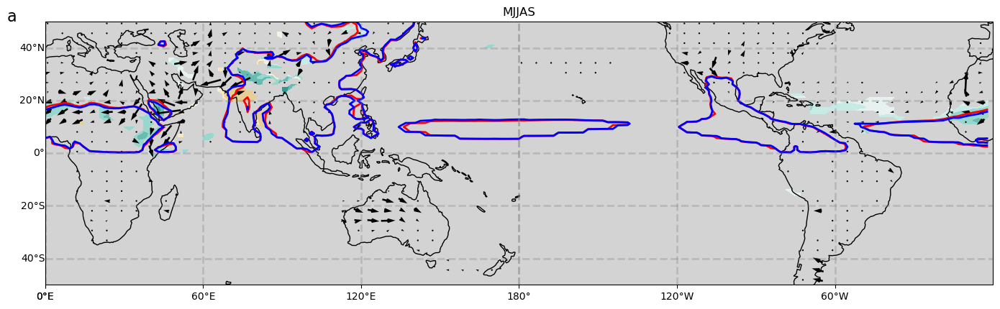

In [84]:
#levels_cntr=[-8,-4,-2,-1,-0.5,-0.25,-0.125,0,0.125,0.25,0.5,1,2,4,8]
levels_cntr=[-11,-9,-7,-5,-3,-1.5,-0.5,-0.25,0,0.25,0.5,1.5,3,5,7,9,11]
ar_threshold = 2.5 #mm/day

plt.figure(figsize=(17,25))
cmap = plt.cm.get_cmap("BrBG")

#Control quiver density
skip = slice(None,None,3)

ax1 = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
# Precip
ts_data1 = ts['lig127k-GlbVeg']['atm']['precip']['raw']
ts_data2 = ts['lig127k']['atm']['precip']['raw']
pval = modTtest3d(ts_data1[ts_data1.time.dt.month.isin([5,6,7,8,9])],
                  ts_data2[ts_data2.time.dt.month.isin([5,6,7,8,9])],
                  alternative='two-sided')
#statres, pval = stats.ttest_ind(ts_data1[ts_data1.time.dt.month.isin([5,6,7,8,9])]
#                                                    ,ts_data2[ts_data2.time.dt.month.isin([5,6,7,8,9])]
#                                                    ,alternative='two-sided')
spy1 = FDR(pval)
ax1.set_facecolor('lightgray')
plot1 = ax1.contourf(accessesm_da['anom']['atm']['precip']['month'].lon, accessesm_da['anom']['atm']['precip']['month'].lat,
                        accessesm_da['anom']['atm']['precip']['month'].sel(month=[5,6,7,8,9]).mean('month').where(spy1==1)*60*60*24,
                        transform=ccrs.PlateCarree(),
                        cmap=cmap,
                        #vmax=20,
                        #vmin=-20
                        levels=levels_cntr,
                        norm=mcolors.BoundaryNorm(levels_cntr, ncolors=cmap.N, clip=True)
                      )
# Monsoon domains
plot3 = ax1.contour(nligveg_ar.lon, nligveg_ar.lat, nligveg_ar, levels=[ar_threshold], colors='red', linewidths=2,
                   transform=ccrs.PlateCarree()
                   )
plot5 = ax1.contour(nlig_ar.lon, nlig_ar.lat, nlig_ar, levels=[ar_threshold], colors='blue', linewidths=2,
                   transform=ccrs.PlateCarree()
                   )
# Surface winds at 10m
ts_data1 = ts['lig127k-GlbVeg']['atm']['10m_wind_speed']['raw']
ts_data2 = ts['lig127k']['atm']['10m_wind_speed']['raw']
pval = modTtest3d(ts_data1[ts_data1.time.dt.month.isin([5,6,7,8,9])],
                  ts_data2[ts_data2.time.dt.month.isin([5,6,7,8,9])],
                  alternative='two-sided')
#statres, pval = stats.ttest_ind(ts_data1[ts_data1.time.dt.month.isin([5,6,7,8,9])]
#                                                    ,ts_data2[ts_data2.time.dt.month.isin([5,6,7,8,9])]
#                                                    ,alternative='two-sided')
spy1 = FDR(pval)
plot7 = ax1.quiver(accessesm_da['anom']['atm']['10U']['month']['lon_u'][skip].values,
                   accessesm_da['anom']['atm']['10U']['month']['lat_v'][skip].values,
                   accessesm_da['anom']['atm']['10U']['month'].sel(month=[5,6,7,8,9]).mean('month').where(spy1==1)[skip,skip].values,
                   accessesm_da['anom']['atm']['10V']['month'].sel(month=[5,6,7,8,9]).mean('month').where(spy1==1)[skip,skip].values,
                    units='xy',scale=0.3,scale_units='xy',
                  width=0.7,headlength=4,headwidth=2.5,
                  pivot='mid',
                  transform=ccrs.PlateCarree()
                  )

ax1.add_feature(cfeature.COASTLINE)
ax1.set_title('MJJAS')
ax1.set_extent([0, 359.999, -50,50])
#cbar = plt.colorbar(plot1,shrink=0.5, orientation="horizontal", pad = 0.02)
#cbar.ax.tick_params(labelsize=14)

#ax1.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
ax1.set_xticks([0, 60, 120, 180, -120,-60,0], crs=ccrs.PlateCarree())
lon_formatter = LongitudeFormatter(zero_direction_label=True)
ax1.xaxis.set_major_formatter(lon_formatter)
gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.3, linestyle='--')
gl.yformatter = LATITUDE_FORMATTER
gl.xlabels_top = False
gl.xlabels_bottom = False

ax1.text(-0.04, 1, 'a', transform=ax1.transAxes, 
            size=16)


Two Sample MODIFIED t-test for spatial data
FDR
P_FDR = 0.00046918123392842485
Number of significant points: 263 out of 27840 tests.
Two Sample MODIFIED t-test for spatial data
FDR
P_FDR = 0.009009596860146357
Number of significant points: 5008 out of 27648 tests.


Text(-0.04, 1, 'b')

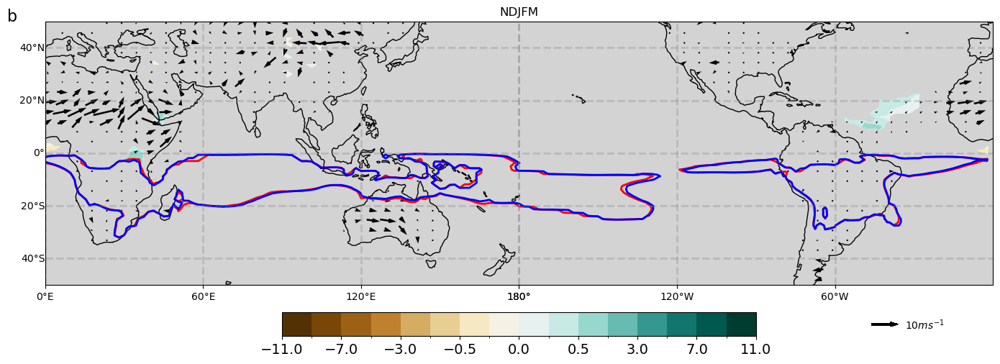

In [88]:
#levels_cntr=[-8,-4,-2,-1,-0.5,-0.25,-0.125,0,0.125,0.25,0.5,1,2,4,8]
levels_cntr=[-11,-9,-7,-5,-3,-1.5,-0.5,-0.25,0,0.25,0.5,1.5,3,5,7,9,11]
ar_threshold = 2.5 #mm/day

plt.figure(figsize=(17,25))
cmap = plt.cm.get_cmap("BrBG")

#Control quiver density
skip = slice(None,None,3)

ax1 = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
# Precip
ts_data1 = ts['lig127k-GlbVeg']['atm']['precip']['raw']
ts_data2 = ts['lig127k']['atm']['precip']['raw']
pval = modTtest3d(ts_data1[ts_data1.time.dt.month.isin([11,12,1,2,3])],
                  ts_data2[ts_data2.time.dt.month.isin([11,12,1,2,3])],
                  alternative='two-sided')
#statres, pval = stats.ttest_ind(ts_data1[ts_data1.time.dt.month.isin([11,12,1,2,3])]
#                                                    ,ts_data2[ts_data2.time.dt.month.isin([11,12,1,2,3])]
#                                                    ,alternative='two-sided')
spy1 = FDR(pval)
ax1.set_facecolor('lightgray')
plot1 = ax1.contourf(accessesm_da['anom']['atm']['precip']['month'].lon, accessesm_da['anom']['atm']['precip']['month'].lat,
                        accessesm_da['anom']['atm']['precip']['month'].sel(month=[11,12,1,2,3]).mean('month').where(spy1==1)*60*60*24,
                        transform=ccrs.PlateCarree(),
                        cmap=cmap,
                        #vmax=11,
                        #vmin=-11,
                        levels=levels_cntr,
                        norm=mcolors.BoundaryNorm(levels_cntr, ncolors=cmap.N, clip=True)
                      )
# Monsoon domains
plot4 = ax1.contour(sligveg_ar.lon, sligveg_ar.lat, sligveg_ar, levels=[ar_threshold], colors='red', linewidths=2,
                   transform=ccrs.PlateCarree())
plot6 = ax1.contour(slig_ar.lon, slig_ar.lat, slig_ar, levels=[ar_threshold], colors='blue', linewidths=2,
                   transform=ccrs.PlateCarree())
# Surface winds at 10m
ts_data1 = ts['lig127k-GlbVeg']['atm']['10m_wind_speed']['raw']
ts_data2 = ts['lig127k']['atm']['10m_wind_speed']['raw']
pval = modTtest3d(ts_data1[ts_data1.time.dt.month.isin([11,12,1,2,3])],
                  ts_data2[ts_data2.time.dt.month.isin([11,12,1,2,3])],
                  alternative='two-sided')
#statres, pval = stats.ttest_ind(ts_data1[ts_data1.time.dt.month.isin([11,12,1,2,3])]
#                                                    ,ts_data2[ts_data2.time.dt.month.isin([11,12,1,2,3])]
#                                                    ,alternative='two-sided')
spy1 = FDR(pval)
plot7 = ax1.quiver(accessesm_da['anom']['atm']['10U']['month']['lon_u'][skip].values,
                   accessesm_da['anom']['atm']['10U']['month']['lat_v'][skip].values,
                   accessesm_da['anom']['atm']['10U']['month'].sel(month=[11,12,1,2,3]).mean('month').where(spy1==1)[skip,skip].values,
                   accessesm_da['anom']['atm']['10V']['month'].sel(month=[11,12,1,2,3]).mean('month').where(spy1==1)[skip,skip].values,
                    units='xy',scale=0.3,scale_units='xy',
                  width=0.7,headlength=4,headwidth=2.5,
                  pivot='mid',
                  transform=ccrs.PlateCarree()
                  )

ax1.add_feature(cfeature.COASTLINE)
ax1.set_title('NDJFM')
ax1.set_extent([0, 359.999, -50,50])
cbar = plt.colorbar(plot1,shrink=0.5, orientation="horizontal", pad = 0.02)
cbar.ax.tick_params(labelsize=14)

#for monsoon in [saf_ligveg, aus_ligveg, sam_ligveg]:
#    if monsoon.longitude[-1]>monsoon.longitude[0]:
#        width=monsoon.longitude[-1]-monsoon.longitude[0]
#    else:
#        width=monsoon.longitude[-1]+(360-monsoon.longitude[0])
    #ax1.add_patch(mpatches.Rectangle(xy=[monsoon.longitude[0],monsoon.latitude[0]],
    #                                     width=width,
    #                                     height=monsoon.latitude[-1]-monsoon.latitude[0],
    #                                     edgecolor='black',
    #                                     fill=False,
    #                                     linewidth=1,
    #                                     linestyle='--',
    #                                     transform=ccrs.PlateCarree()))

ax1.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
lon_formatter = LongitudeFormatter(zero_direction_label=True)
ax1.xaxis.set_major_formatter(lon_formatter)
gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=2, color='gray', alpha=0.3, linestyle='--')
gl.yformatter = LATITUDE_FORMATTER
gl.xlabels_top = False
gl.xlabels_bottom = False
qk = ax1.quiverkey(plot7, 0.9, -0.15, 0.3*10, label='$10 ms^{-1}$', labelpos='E',
                   coordinates='axes')
ax1.text(-0.04, 1, 'b', transform=ax1.transAxes, 
            size=16)
